In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import healpy as hp
import rubin_sim.maf as maf

In [2]:
families = maf.archive.get_family_descriptions('runs_v2.2.json')
family_list = families.index.values
summary_source = 'summaries_2022_11_08.csv'
summaries = maf.get_metric_summaries(summary_source=summary_source)
metrics_source = 'metric_sets.json'
metric_sets = maf.get_metric_sets(metrics_source)

# list the metric sets
msets = list(metric_sets.groupby('metric set').first().index)

---
**draft v3** : Draft versions of simulations incorporating the SCOC Phase 2 recommendations for survey strategy.  
**version**: 2.99  
**runs**:  


,brief,Area with >825 visits/pointing (fO_Area),Unextincted area i>25.9,Nvisits total,Median Nvis over top 18k (fO_Nv Med),Median Nvis u band,Median Nvis g band,Median Nvis r band,Median Nvis i band,Median Nvis z band,Median Nvis y band
run,,,,,,,,,,,
draft_connected_v2.99_10yrs,"DDF at 7.5%, twilight NEO microsurvey, priority GP footprint.",1953.04,16988.14,2076864.0,792.0,46.0,63.0,173.0,177.0,152.0,158.0
draft_v2.99_10yrs,"Less connected, agg_level 1.5, galactic plane footprint. Otherwise like draft_connected.",2112.50,16997.37,2076066.0,790.0,45.0,62.0,171.0,174.0,152.0,159.0
roll_early_v2.99_10yrs,"Starting rolling early and increase suppress revisit weight. DDF at 7.5%, twilight NEO microsurvey, priority GP footprint.",1945.48,16893.30,2077239.0,792.0,45.0,64.0,173.0,177.0,152.0,158.0
dd6_v2.99_10yrs,"DDF at 5%, twilight NEO microsurvey, priority GP footprint.",5309.37,17109.84,2077797.0,810.0,46.0,65.0,177.0,180.0,155.0,162.0
low_gp_v2.99_10yrs,"DDF at 7.5%, twilight NEO microsurvey, priority GP footprint but low nvisits.",8264.52,17135.02,2077254.0,822.0,47.0,65.0,177.0,181.0,158.0,164.0
more_z_v2.99_10yrs,Like draft_connected but swap u/z/y instead of just u/z.,1371.41,16962.96,2075596.0,785.0,45.0,63.0,171.0,175.0,151.0,157.0
light_roll_v2.99_10yrs,"Draft_connected footprint but full strength near-sun twilight microsurvey. Rolling flipped, roll strength 0.5, higher suppress revisits weight, more g in SCP/GP.",650.45,16876.52,2082888.0,776.0,45.0,62.0,172.0,176.0,152.0,155.0


(0.8, 1.2)

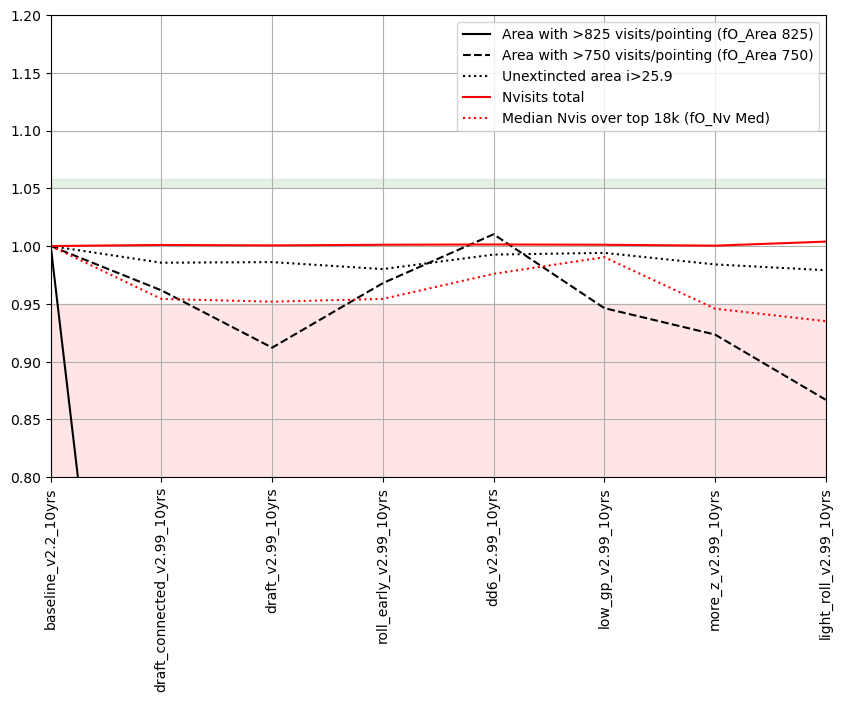

In [3]:
fig, ax = maf.archive.describe_families(
        families.loc[['draft v3'], :],
        summary=summaries,
        table_metric_set=metric_sets.loc["short description"],
        plot_metric_set=metric_sets.loc["plot areas"],
        baseline_run=families.loc['draft v3', "reference"],
    )
ax.set_ylim(0.8, 1.2)

In [4]:
ddir = os.getenv("OPSIM_DB_DIR")
if ddir is None:
    ddir = '/Users/lynnej/opsim'

draft_runs = list(families.explode('run').loc['draft v3', 'run'])
draft_runs

['draft_connected_v2.99_10yrs',
 'draft_v2.99_10yrs',
 'roll_early_v2.99_10yrs',
 'dd6_v2.99_10yrs',
 'low_gp_v2.99_10yrs',
 'more_z_v2.99_10yrs',
 'light_roll_v2.99_10yrs']

In [10]:
opsdb = {}
t = families.explode(['run', 'filepath']).loc['draft v3', ['run', 'filepath']].set_index('run')
for r in draft_runs:
    fpath = os.path.join(ddir, t.loc[r, 'filepath'])
    if os.path.isfile(fpath):
        opsdb[r] = fpath
    else:
        print(f'No file at {fpath}')
t = families.explode(['run', 'filepath']).loc['baseline', ['run', 'filepath']].set_index('run')
for r in ['baseline_v2.2_10yrs']:
    fpath = os.path.join(ddir, t.loc[r, 'filepath'])    
    if os.path.isfile(fpath):
        opsdb[r] = fpath
    else:
        print(f'No file at {fpath}')

In [11]:
outDir = 'draft_temp'
nside=64
bundles = {}
filterlist, colors, orders, sqls, info_labels = maf.filterList(all=True)

metric = maf.CountMetric(col='observationStartMJD', metricName='Nvisits')
s = maf.HealpixSlicer(nside=nside)
for r in draft_runs:
    bundles[r] = {}
    for f in filterlist:        
        bundles[r][f] = maf.MetricBundle(metric, s, sqls[f], info_label=info_labels[f], runName=r)
    g = maf.MetricBundleGroup(bundles[r], opsdb[r], outDir=outDir)
    g.runAll()
    
for r in ['baseline_v2.2_10yrs']:
    bundles[r] = {}
    for f in filterlist:
        bundles[r][f] = maf.MetricBundle(metric, s, sqls[f], info_label=info_labels[f], runName=r)
    g = maf.MetricBundleGroup(bundles[r], opsdb[r], outDir=outDir)
    g.runAll()

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes


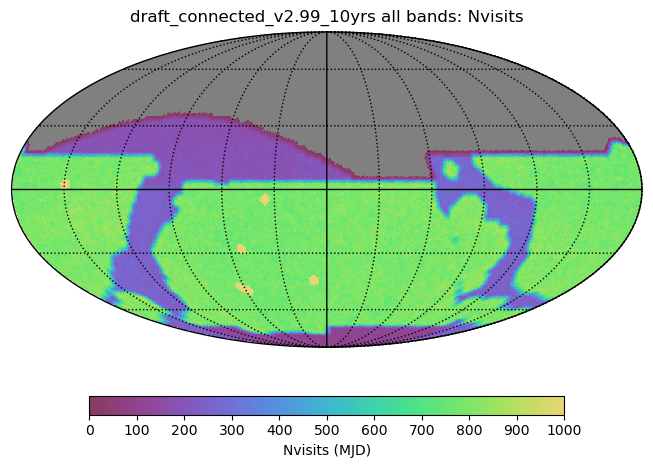

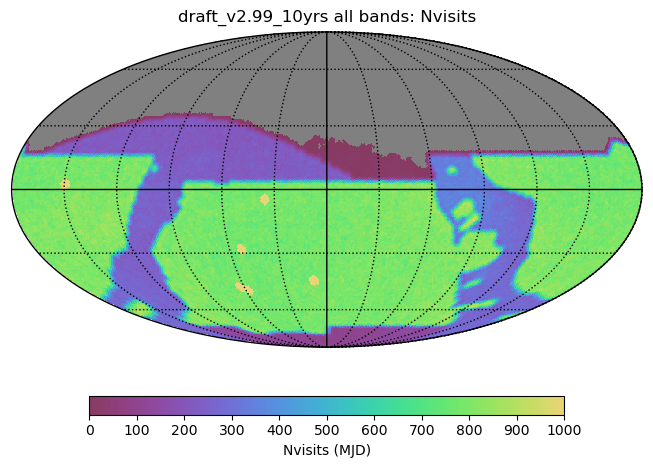

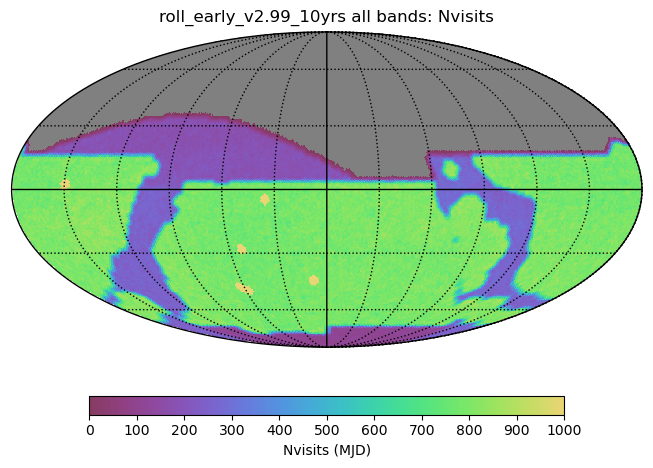

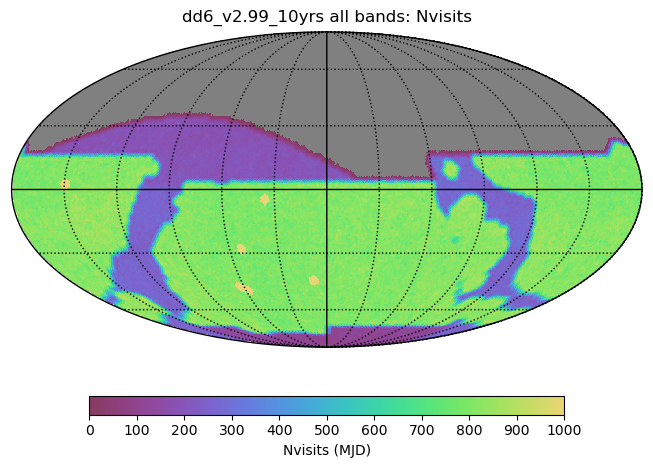

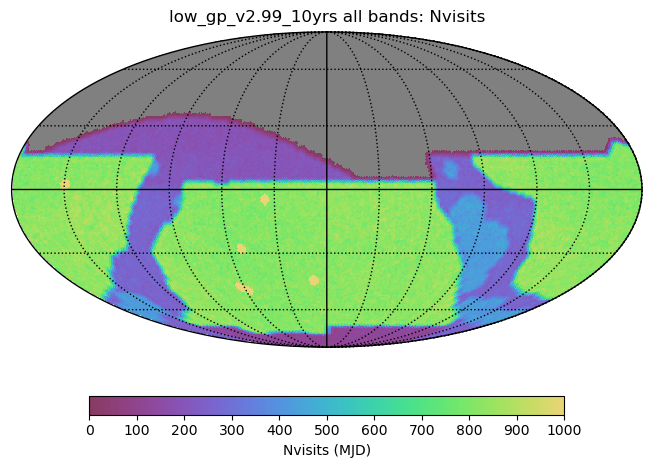

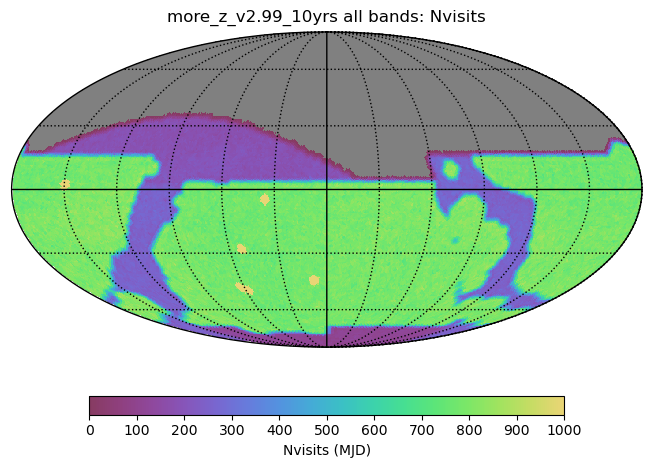

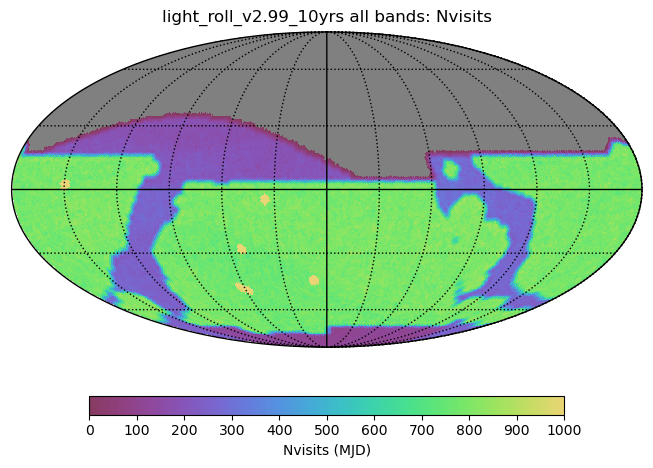

In [12]:
ph = maf.PlotHandler(outDir=outDir, thumbnail=False, figformat='png')
for r in draft_runs:
    plotDict = {'colorMin': 0, 'colorMax': 1000}
    ph.setMetricBundles([bundles[r]['all']])
    ph.plot(maf.HealpixSkyMap(), plotDicts=plotDict)

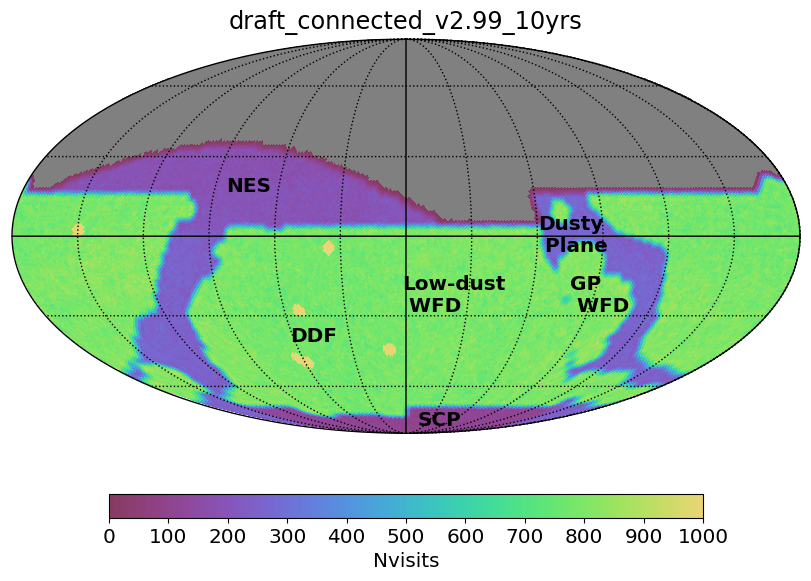

In [13]:
ph = maf.PlotHandler(outDir=outDir, thumbnail=False, figformat='png')
for r in draft_runs[0:1]:
    plotDict={'colorMin': 0, 'colorMax':1000, 'figsize': (8, 6),
                   'labelsize': 'x-large', 'fontsize':'x-large', 'xlabel': "Nvisits"}
    ph.setMetricBundles([bundles[r]['all']])
    ph.plot(maf.HealpixSkyMap(), plotDicts=plotDict)
    plt.figtext(0.50, 0.45, 'Low-dust\n WFD', fontsize='x-large', fontweight='bold')
    plt.figtext(0.28, 0.65, 'NES', fontsize='x-large', fontweight='bold')
    plt.figtext(0.71, 0.45, 'GP\n WFD', fontsize='x-large', fontweight='bold')
    plt.figtext(0.67, 0.55, 'Dusty\n Plane', fontsize='x-large', fontweight='bold')
    plt.figtext(0.52, 0.26, 'SCP', fontsize='x-large', fontweight='bold')
    plt.figtext(0.36, 0.4, 'DDF', fontsize='x-large', fontweight='bold')
    plt.title(f'{r}', fontsize='xx-large', fontweight='normal')

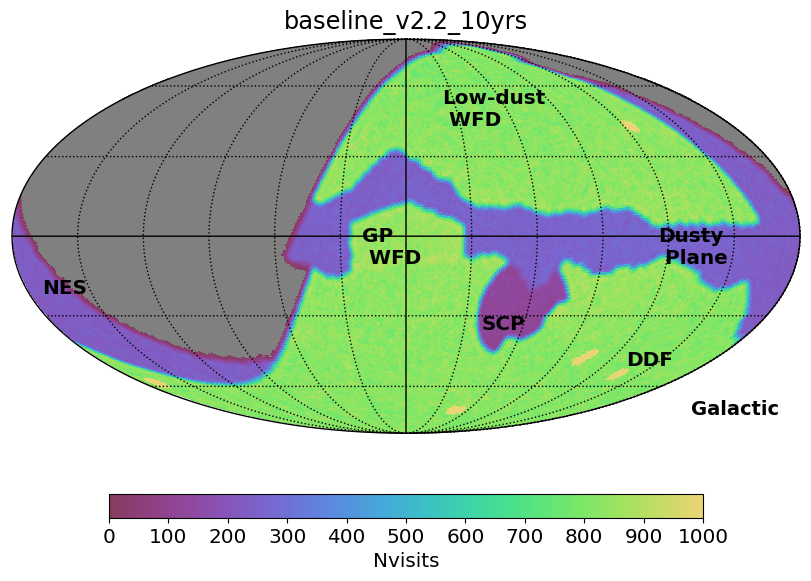

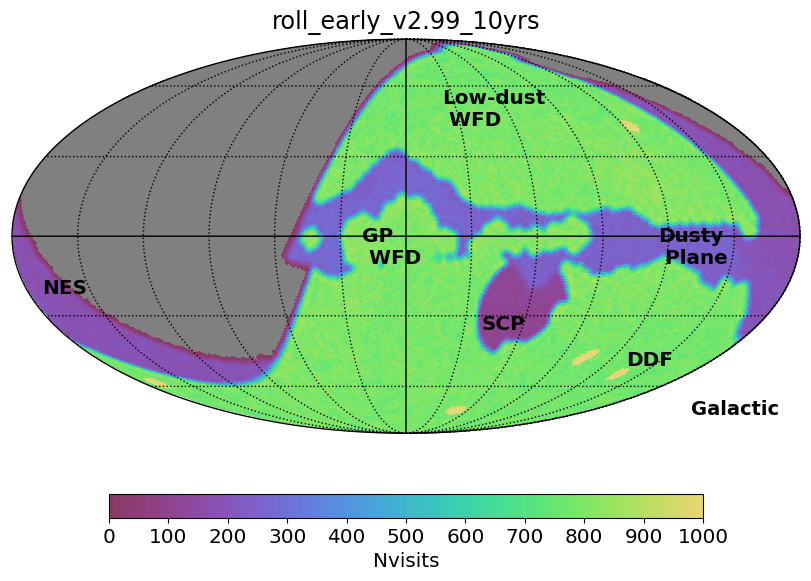

In [14]:
ph = maf.PlotHandler(outDir=outDir, thumbnail=False, figformat='png')
for r in ['baseline_v2.2_10yrs', 'roll_early_v2.99_10yrs']:
    plotDict={'colorMin': 0, 'colorMax':1000, 'figsize': (8, 6), 'coord': 'CG', 'rot': (0, 0, 0),
                   'labelsize': 'x-large', 'fontsize':'x-large', 'xlabel': "Nvisits"}
    ph.setMetricBundles([bundles[r]['all']])
    ph.plot(maf.HealpixSkyMap(), plotDicts=plotDict)
    plt.figtext(0.55, 0.76, 'Low-dust\n WFD', fontsize='x-large', fontweight='bold')
    plt.figtext(0.05, 0.48, 'NES', fontsize='x-large', fontweight='bold')
    plt.figtext(0.45, 0.53, 'GP\n WFD', fontsize='x-large', fontweight='bold')
    plt.figtext(0.82, 0.53, 'Dusty\n Plane', fontsize='x-large', fontweight='bold')
    plt.figtext(0.6, 0.42, 'SCP', fontsize='x-large', fontweight='bold')
    plt.figtext(0.78, 0.36, 'DDF', fontsize='x-large', fontweight='bold')
    plt.title(f'{r}', fontsize='xx-large', fontweight='normal')

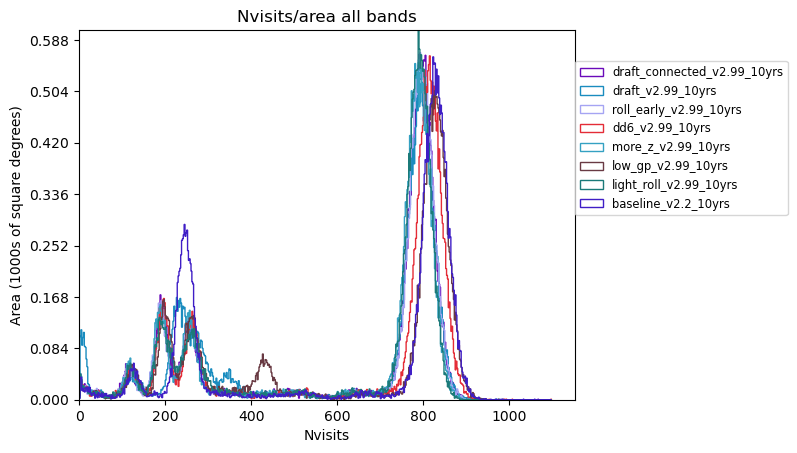

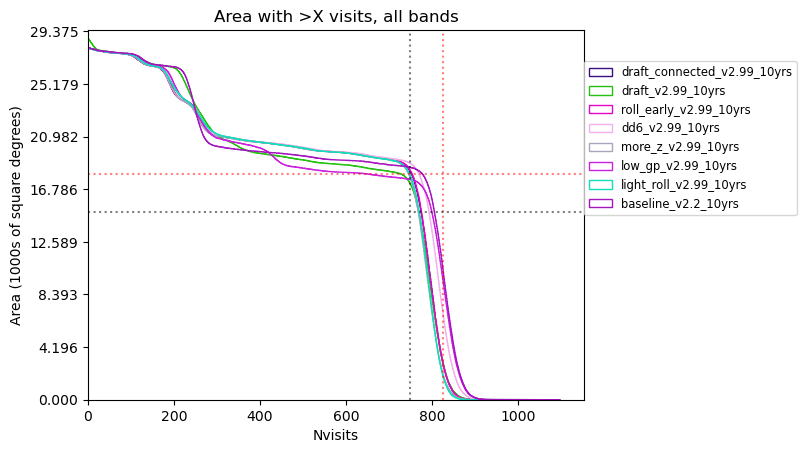

In [15]:
# Area / Nvisits 

draft_colors = dict(zip(draft_runs, ['b', 'k', 'r', 'g', '']))
draft_colors['baseline_v2.2_10yrs'] = 'm'

plotDicts = []
blist = []
for r in draft_runs + ['baseline_v2.2_10yrs']:
    plotDicts.append({#'color': draft_colors[r], 
                      'xMin': 0,
                      'bins':np.arange(0, 1100, 2),
                     'legendloc': (1.0, 0.5),
                     'title': "Nvisits/area all bands"})
    blist.append(bundles[r]['all'])
ph.setMetricBundles(blist)
ph.plot(maf.HealpixHistogram(), plotDicts=plotDicts)


plotDicts = []
plotDicts = []
blist = []
for r in draft_runs + ['baseline_v2.2_10yrs']:
    plotDicts.append({#'color': draft_colors[r], 
                      'xMin': 0,
                      'cumulative': -1,
                      'bins':np.arange(0, 1100, 1),
                     'legendloc': (1.0, 0.5),
                     'title': "Area with >X visits, all bands"})
    blist.append(bundles[r]['all'])
ph.setMetricBundles(blist)
ph.plot(maf.HealpixHistogram(), plotDicts=plotDicts)
plt.axvline(750, color='k', linestyle=':', alpha=0.5)
plt.axvline(825, color='r', linestyle=':', alpha=0.5)
yscale = hp.nside2pixarea(s.nside, degrees=True) / 1000.0
plt.axhline(18/yscale, color='r', linestyle=':', alpha=0.5)
plt.axhline(15/yscale, color='k', linestyle=':', alpha=0.5)

In [16]:
# Pull down target footprint information
import requests
rooturl = 'https://raw.githubusercontent.com/lsst-sims/sims_featureScheduler_runs3.0/main/draft/'
for file in ['draft_connected.py', 'make_ddf_survey.py', 'gen_long_gaps.py']:
    r = requests.get(rooturl+file, allow_redirects=True)
    with open(file, 'w') as f:
        f.write(r.content.decode())
    
from draft_connected import Sky_area_generator_galplane
sky = Sky_area_generator_galplane(nside=nside, smc_radius=4, lmc_radius=6)
footprints, labels = sky.return_maps(
    bulge_ratios={"u": 0.23, "g": 0.43, "r": 1.22, "i": 1.17, "z": 0.82, "y": 0.65},
    dusty_plane_ratios={
        "u": 0.08,
        "g": 0.12,
        "r": 0.31,
        "i": 0.31,
        "z": 0.28,
        "y": 0.22,
    },
)

total_fp = np.zeros(len(footprints['r']))
for f in 'ugrizy':
    total_fp += footprints[f]
#hp.mollview(total_fp)
np.unique(labels)


from rubin_sim.scheduler.utils import Sky_area_generator

sky_v2 = Sky_area_generator(nside=nside)
footprints_v2, labels_v2 = sky_v2.return_maps()

In [17]:
# Count median visits per pointing in each of these regions within the footprint
# To swap to number of visits in a particular filter - change 'f'
f = 'all'
median_nvisits = {}
for r in draft_runs:
    median_nvisits[r] = {}
    for l in np.unique(labels):
        if l == '':
            continue
        median_nvisits[r][l] = np.median(bundles[r][f].metricValues.filled(0)[np.where(labels == l)])
r = 'baseline_v2.2_10yrs'
median_nvisits[r] = {}
for l in np.unique(labels_v2):
    if l == '':
        continue
    l_assign = l
    if l == 'bulge':
        l_assign = 'bulgy'
    median_nvisits[r][l_assign] = np.median(bundles[r][f].metricValues.filled(0)[np.where(labels_v2 == l)])
pd.DataFrame(median_nvisits)

,draft_connected_v2.99_10yrs,draft_v2.99_10yrs,roll_early_v2.99_10yrs,dd6_v2.99_10yrs,low_gp_v2.99_10yrs,more_z_v2.99_10yrs,light_roll_v2.99_10yrs,baseline_v2.2_10yrs
LMC_SMC,786.0,789.0,788.0,807.0,817.0,781.0,774.0,830.0
bulgy,809.0,511.0,813.0,830.0,429.0,806.0,805.0,853.0
dusty_plane,266.0,283.0,268.0,272.0,269.0,264.0,274.0,259.0
lowdust,795.0,795.0,794.0,813.0,828.0,788.0,789.0,827.0
nes,195.0,230.0,191.0,197.0,202.0,192.0,197.0,238.0
scp,121.0,132.0,121.0,125.0,130.0,122.0,126.0,133.0
virgo,765.0,780.0,773.0,798.0,813.0,758.0,791.0,805.0


In [18]:
# Count median visits per pointing in each of these regions within the footprint per filter
median_nvisits = {}
for r in draft_runs:
    median_nvisits[r] = {}
    for l in np.unique(labels):
        if l == '':
            continue
        for f in 'ugrizy':
            median_nvisits[r][f'{l} {f}'] = np.median(bundles[r][f].metricValues.filled(0)[np.where(labels == l)])
r = 'baseline_v2.2_10yrs'
median_nvisits[r] = {}
for l in np.unique(labels_v2):
    if l == '':
        continue
    l_assign = l
    if l == 'bulge':
        l_assign = 'bulgy'
    for f in 'ugrizy':
        median_nvisits[r][f'{l_assign} {f}'] = np.median(bundles[r][f].metricValues.filled(0)[np.where(labels_v2 == l)])
pd.DataFrame(median_nvisits)

,draft_connected_v2.99_10yrs,draft_v2.99_10yrs,roll_early_v2.99_10yrs,dd6_v2.99_10yrs,low_gp_v2.99_10yrs,more_z_v2.99_10yrs,light_roll_v2.99_10yrs,baseline_v2.2_10yrs
LMC_SMC u,47.0,47.0,47.0,48.0,49.0,48.0,47.0,52.0
LMC_SMC g,65.0,65.0,66.0,66.0,68.0,65.0,64.0,68.0
LMC_SMC r,175.0,176.0,174.0,178.0,181.0,171.0,171.0,184.0
LMC_SMC i,179.0,178.0,179.0,185.0,185.0,177.0,174.0,187.0
LMC_SMC z,157.0,157.0,156.0,161.0,163.0,156.0,154.0,164.0
LMC_SMC y,162.0,164.0,164.0,167.0,167.0,161.0,161.0,172.0
bulgy u,36.0,23.0,36.0,36.0,22.0,36.0,33.0,33.0
bulgy g,72.0,44.0,74.0,74.5,38.0,73.0,102.0,186.0
bulgy r,220.0,135.0,219.0,226.0,115.0,217.0,214.0,196.0
bulgy i,215.0,137.0,215.0,220.0,113.0,213.0,199.0,200.0


In [19]:
# Count fraction of survey visits in various parts of the sky 
bundles2 = {}

for r in draft_runs:
    bundles2[r] = {}
    for l in np.unique(labels):
        if l == '': 
            continue
        footprint = np.where(labels == l, 1, 0)
        bdict = maf.nvisitsPerSubset(runName=r, constraint=None, footprintConstraint=footprint,
                                    extraInfoLabel= l)
        k = list(bdict.keys())[0]
        bundles2[r][l] = bdict[k]
    g = maf.MetricBundleGroup(bundles2[r], opsdb[r], outDir=outDir)
    g.runAll()
for r in ['baseline_v2.2_10yrs']:
    bundles2[r] = {}
    for l in np.unique(labels_v2):
        if l == '':
            continue
        footprint = np.where(labels_v2 == l, 1, 0)
        bdict = maf.nvisitsPerSubset(runName=r, constraint=None, footprintConstraint=footprint,
                                    extraInfoLabel= l)
        k = list(bdict.keys())[0]
        bundles2[r][l] = bdict[k]
    g = maf.MetricBundleGroup(bundles2[r], opsdb[r], outDir=outDir)
    g.runAll()

/Users/lynnej/lsst_repos/rubin_sim/rubin_sim/maf/stackers/baseStacker.py:132: UserWarning: Warning - column areaId already present in simData, may be overwritten (depending on stacker).
  warnings.warn(
/Users/lynnej/lsst_repos/rubin_sim/rubin_sim/maf/stackers/baseStacker.py:132: UserWarning: Warning - column areaId already present in simData, may be overwritten (depending on stacker).
  warnings.warn(
/Users/lynnej/lsst_repos/rubin_sim/rubin_sim/maf/stackers/baseStacker.py:132: UserWarning: Warning - column areaId already present in simData, may be overwritten (depending on stacker).
  warnings.warn(
/Users/lynnej/lsst_repos/rubin_sim/rubin_sim/maf/stackers/baseStacker.py:132: UserWarning: Warning - column areaId already present in simData, may be overwritten (depending on stacker).
  warnings.warn(
/Users/lynnej/lsst_repos/rubin_sim/rubin_sim/maf/stackers/baseStacker.py:132: UserWarning: Warning - column areaId already present in simData, may be overwritten (depending on stacker).
  

In [20]:
# Fractions of visits in different footprint regions.
visit_fractions = {}
for r in bundles2:
    visit_fractions[r] = {}
    for l in bundles2[r]:
        l_assign = l
        if l == 'bulge':
            l_assign = 'bulgy'
        visit_fractions[r][l_assign] = bundles2[r][l].summaryValues['Identity']
        
pd.DataFrame(visit_fractions)/summaries.loc[list(bundles2.keys()), 'Nvisits All visits']

,draft_connected_v2.99_10yrs,draft_v2.99_10yrs,roll_early_v2.99_10yrs,dd6_v2.99_10yrs,low_gp_v2.99_10yrs,more_z_v2.99_10yrs,light_roll_v2.99_10yrs,baseline_v2.2_10yrs
LMC_SMC,0.016179,0.016268,0.016228,0.016564,0.016774,0.016091,0.015864,0.022145
bulgy,0.069002,0.045270,0.069090,0.070712,0.036855,0.068456,0.068131,0.041516
dusty_plane,0.064711,0.063110,0.064952,0.066125,0.061061,0.064236,0.065320,0.069443
lowdust,0.744314,0.744865,0.744141,0.760959,0.775313,0.738458,0.736700,0.772618
nes,0.038405,0.043244,0.037758,0.038787,0.039281,0.037811,0.038898,0.045357
scp,0.008948,0.009337,0.009003,0.009235,0.009419,0.009003,0.009090,0.009346
virgo,0.003631,0.003667,0.003637,0.003726,0.003811,0.003589,0.003711,0.003855


In [21]:
# Count the visits taken for particular special survey reasons, or in the WFD region (total WFD)
import sqlite3
t = families.explode(['run', 'filepath']).loc['draft v3', ['run', 'filepath']].set_index('run')
specials = ['twilight_neo', 'long']
count = {}
for r in draft_runs:
    print(r)
    count[r] = {}
    conn = sqlite3.connect(opsdb[r])
    cursor = conn.cursor()
    for s in specials:
        query = f'select count(*) from observations where note like "%{s}%"'
        results = cursor.execute(query).fetchall()
        count[r][s] = int(results[0][0])
    conn.close()

pd.concat([pd.DataFrame(count), 
           summaries.loc[draft_runs, ['Nvisits DDF', 'Nvisits WFD', 'Nvisits All visits']].T])

draft_connected_v2.99_10yrs
draft_v2.99_10yrs
roll_early_v2.99_10yrs
dd6_v2.99_10yrs
low_gp_v2.99_10yrs
more_z_v2.99_10yrs
light_roll_v2.99_10yrs


,draft_connected_v2.99_10yrs,draft_v2.99_10yrs,roll_early_v2.99_10yrs,dd6_v2.99_10yrs,low_gp_v2.99_10yrs,more_z_v2.99_10yrs,light_roll_v2.99_10yrs
twilight_neo,18861.0,17963.0,18529.0,18591.0,18182.0,17745.0,42860.0
long,90116.0,87051.0,90075.0,94084.0,90276.0,90344.0,90392.0
Nvisits DDF,150590.0,181128.0,150689.0,107076.0,150535.0,165288.0,165357.0
Nvisits WFD,1662976.0,1579449.0,1664976.0,1712919.0,1611317.0,1644212.0,1609163.0
Nvisits All visits,2076864.0,2076066.0,2077239.0,2077797.0,2077254.0,2075596.0,2082888.0


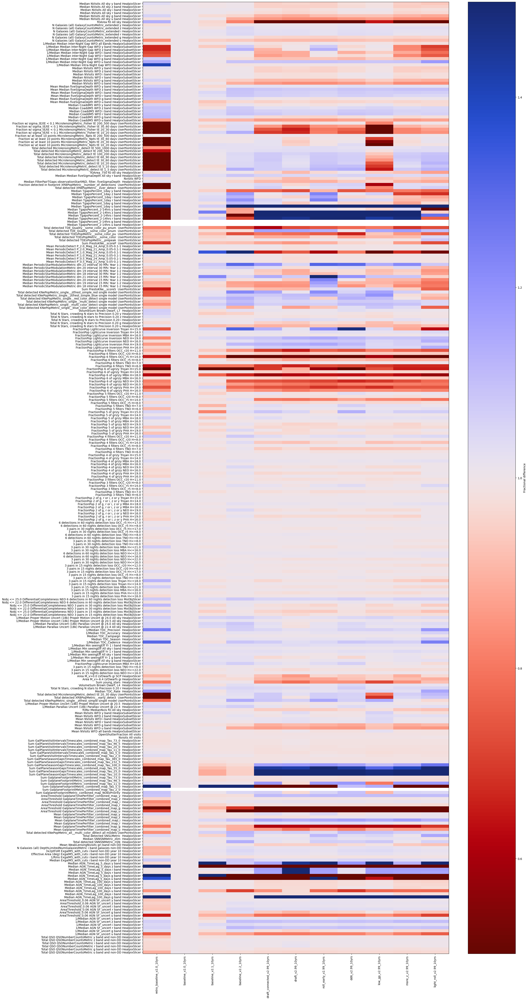

In [23]:
# Comparisons of metrics 

baseline_run = 'baseline_v2.0_10yrs'

these_runs = ['retro_baseline_v2.0_10yrs', 'baseline_v2.0_10yrs', 
              'baseline_v2.1_10yrs', 'baseline_v2.2_10yrs'] + draft_runs

# We can plot them all together, but need to remove duplicates
non_dd = [m for m in msets if 'DD' not in m]
msub = metric_sets.loc[non_dd].reset_index(drop=True).drop('style', axis=1).drop('short_name', axis=1)
msub = msub.drop_duplicates().set_index('metric', drop=False, verify_integrity=True)

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                   baseline_run=baseline_run,
                                   #metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=1)
fig.set_figwidth(24)
fig.set_figheight(60)

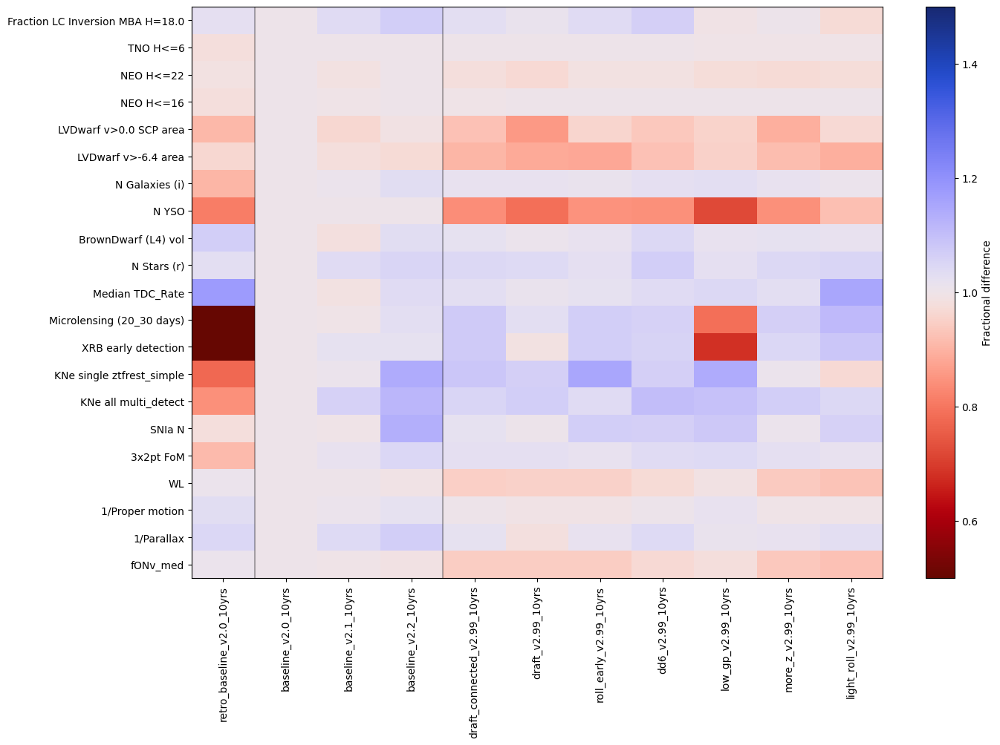

In [24]:
msub = metric_sets.loc['SCOC']
fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                   baseline_run=baseline_run,
                                   metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=1)
ax.axvline(1, color='k', alpha=0.3)
ax.axvline(4, color='k', alpha=0.3)
fig.set_figwidth(15)
fig.set_figheight(10)

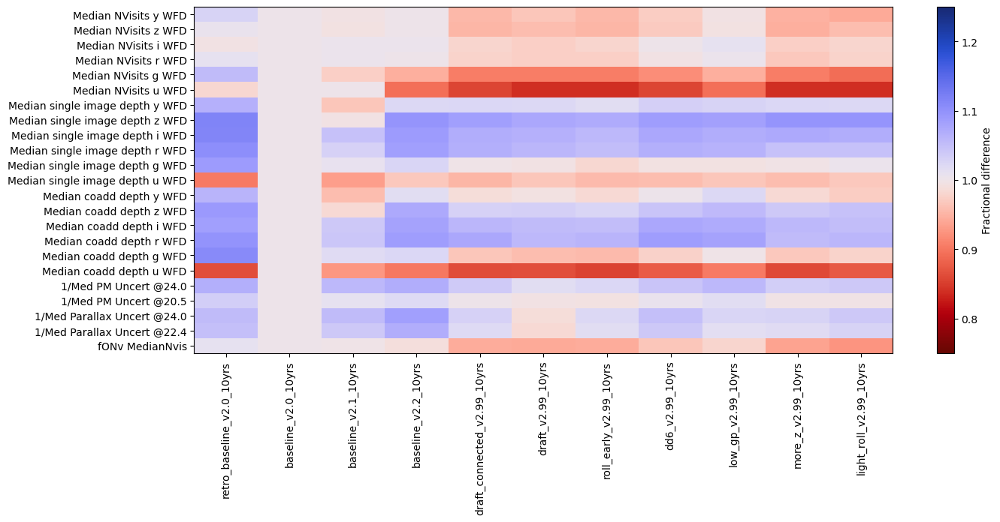

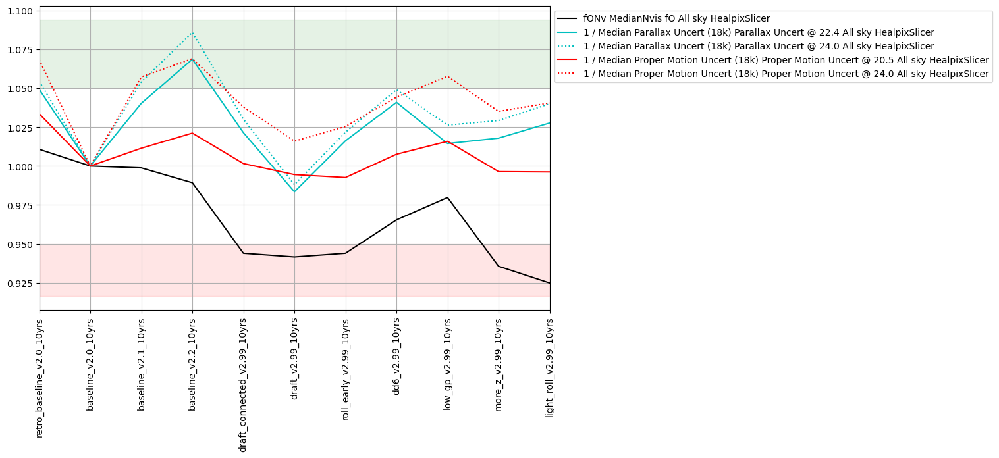

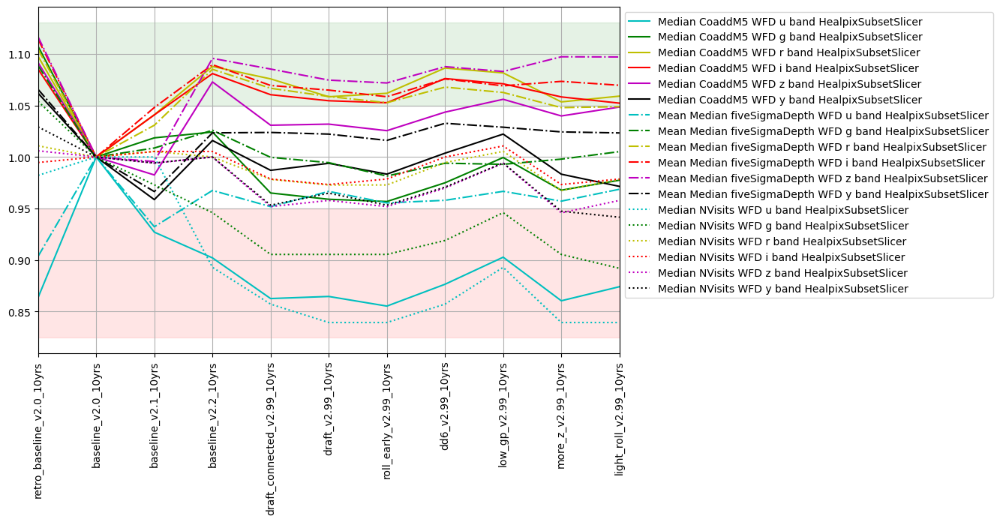

In [25]:
# Very basic metrics 

msub = metric_sets.loc[['SRD', 'WFD Depths']].reset_index('metric set')
fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                   baseline_run=baseline_run,
                                   metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=0.5)
fig.set_figwidth(15)

msub = metric_sets.loc['SRD']
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msub['metric']],
                             baseline_run=baseline_run,
                             metric_set=msub,
                            horizontal_quantity='run', 
                             vertical_quantity='value')

msub = metric_sets.loc['WFD Depths']
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msub['metric']],
                             baseline_run=baseline_run,
                             metric_set=msub,
                            horizontal_quantity='run', 
                             vertical_quantity='value')

In [26]:
msubm = list(metric_sets.loc['WFD Depths'].query('metric.str.contains("NVisits")', 
                                                 engine='python')['metric'].values)
msubm.append('Median NVisits WFD all bands HealpixSubsetSlicer')
def func(x):
    return x.replace(' HealpixSubsetSlicer', '')
summaries.loc[draft_runs, msubm].rename(mapper=func, axis=1).T

run,draft_connected_v2.99_10yrs,draft_v2.99_10yrs,roll_early_v2.99_10yrs,dd6_v2.99_10yrs,low_gp_v2.99_10yrs,more_z_v2.99_10yrs,light_roll_v2.99_10yrs
metric,,,,,,,
Median NVisits WFD u band,48.0,47.0,47.0,48.0,50.0,47.0,47.0
Median NVisits WFD g band,67.0,67.0,67.0,68.0,70.0,67.0,66.0
Median NVisits WFD r band,180.0,179.0,179.0,183.0,185.0,178.0,180.0
Median NVisits WFD i band,183.0,182.0,183.0,187.0,189.0,182.0,183.0
Median NVisits WFD z band,158.0,159.0,158.0,161.0,165.0,157.0,159.0
Median NVisits WFD y band,163.0,165.0,163.0,166.0,170.0,162.0,161.0
Median NVisits WFD all bands,799.0,798.0,798.0,815.0,828.0,794.0,797.0


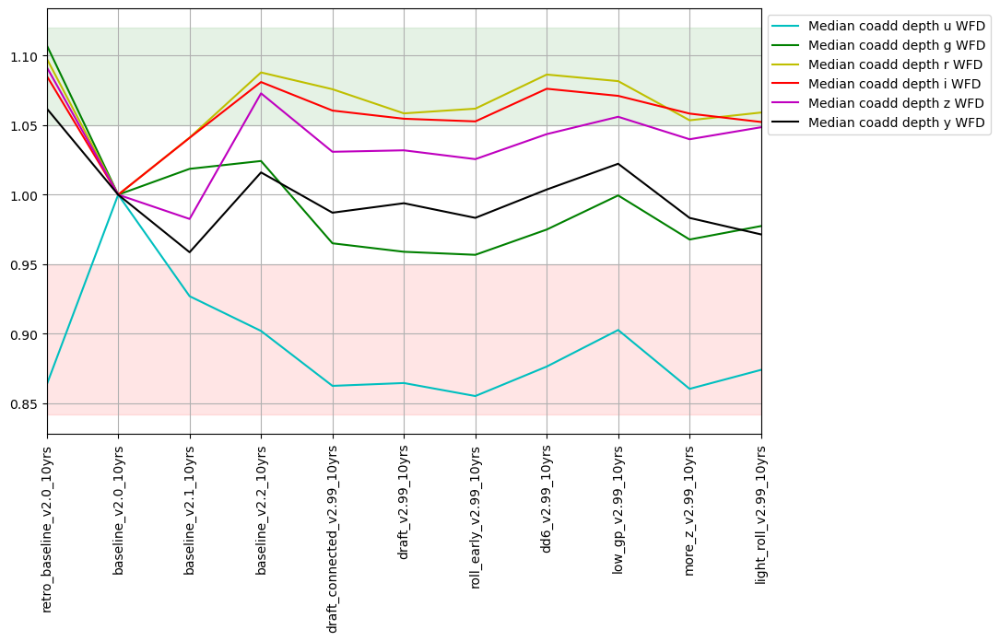

In [27]:
msubm = metric_sets.loc['WFD Depths'].query('metric.str.contains("CoaddM5")', 
                                                 engine='python')
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msubm['metric']],
                             baseline_run=baseline_run,
                             metric_set=msubm,
                              metric_label_map=msubm['short_name'],
                            horizontal_quantity='run', 
                             vertical_quantity='value')

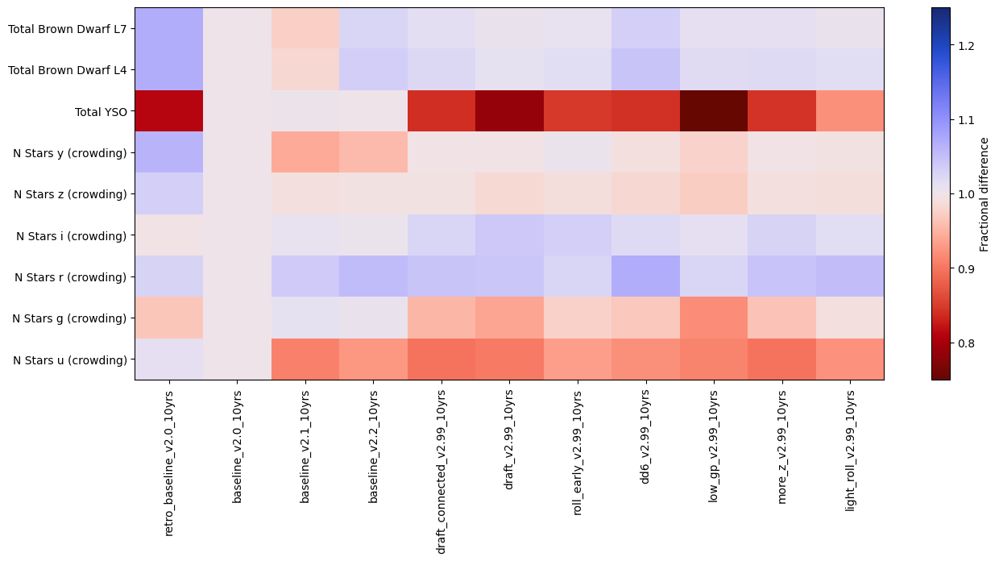

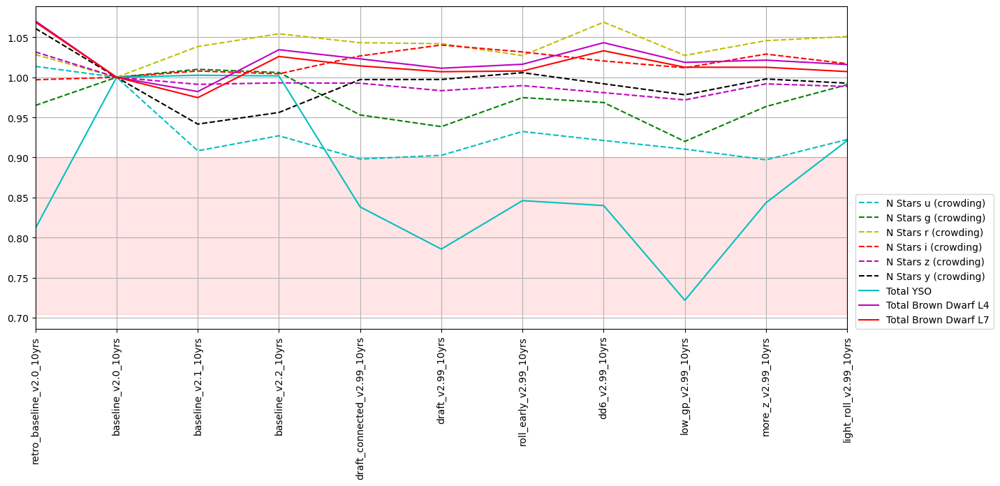

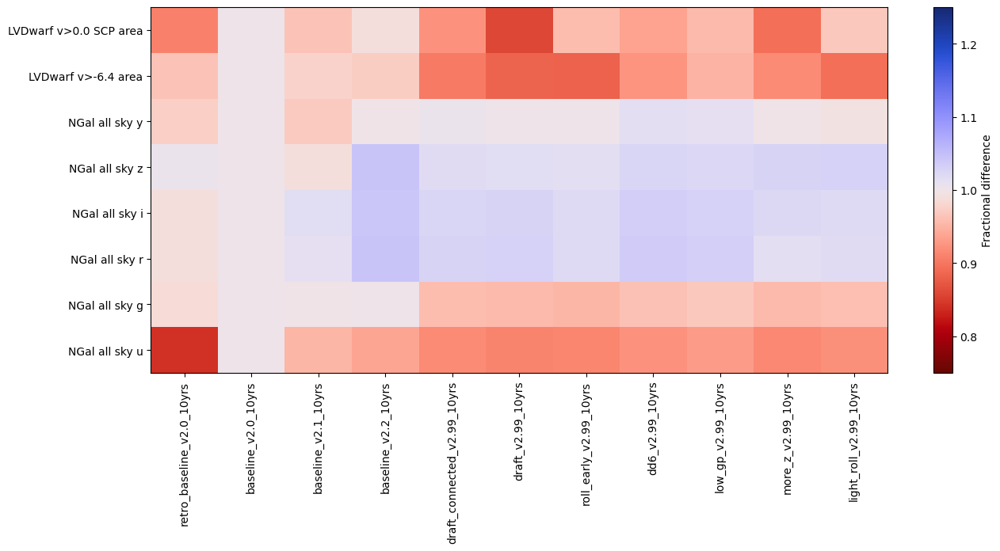

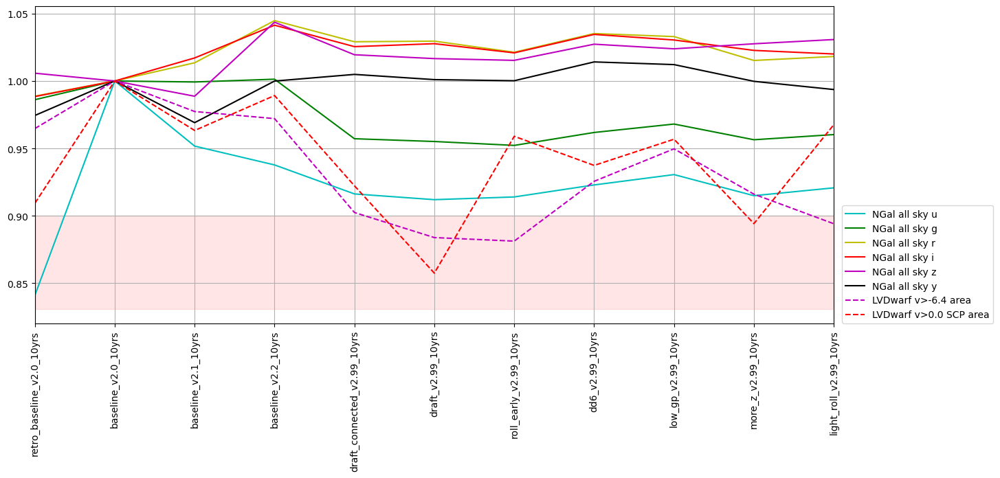

In [28]:
# Stars and Galaxy counts metrics
k_sets = ['Stars', 'galaxies']
for k in k_sets:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                       baseline_run=baseline_run,
                                       metric_label_map=msub['short_name'],
                                       metric_set=msub,
                                      color_range=0.5)
    fig.set_figwidth(15)


    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value', 
                                 shade_fraction=0.1)
    fig.set_figwidth(15)
    ylim = list(ax.get_ylim())
    ax.set_ylim(max(0.2, ylim[0]), min(2, ylim[1]))
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')

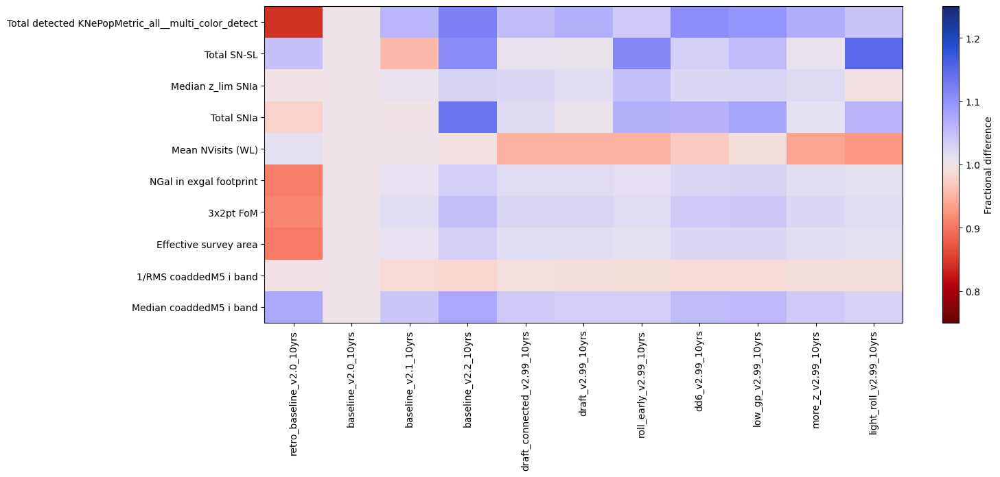

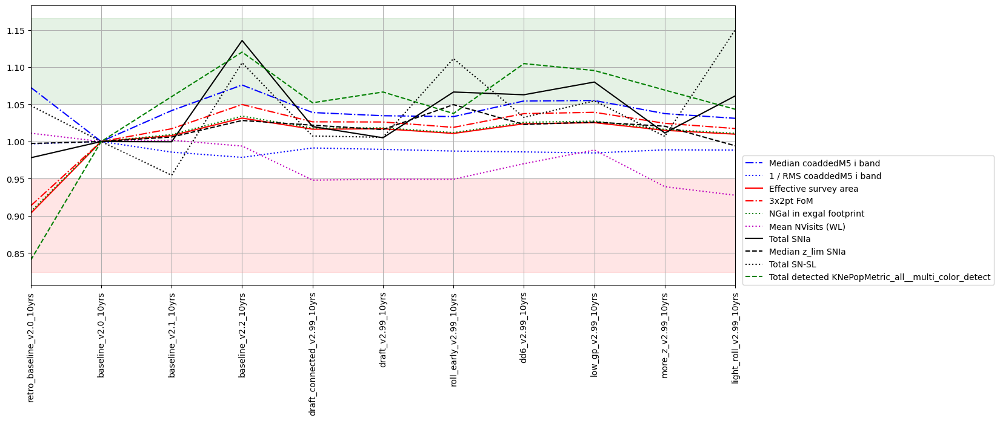

In [29]:
# DESC metrics
k_sets = [k for k in msets if k.startswith('DESC') and not k.endswith('DDF')]

for k in k_sets:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                       baseline_run=baseline_run,
                                       metric_label_map=msub['short_name'],
                                       metric_set=msub,
                                      color_range=0.5)
    fig.set_figwidth(15)


    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value')
    fig.set_figwidth(15)
    #ax.set_ylim(0.5, 1.5)
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')


SSO discovery
SSO lightcurve inversion


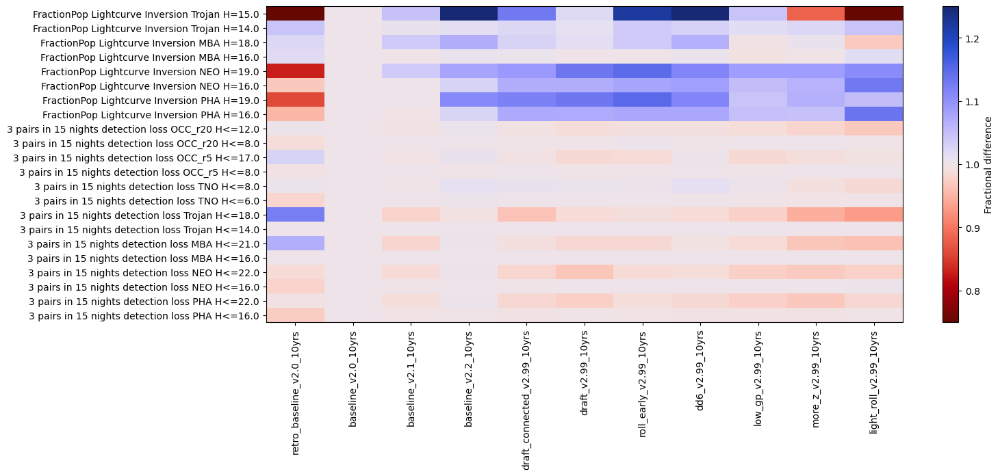

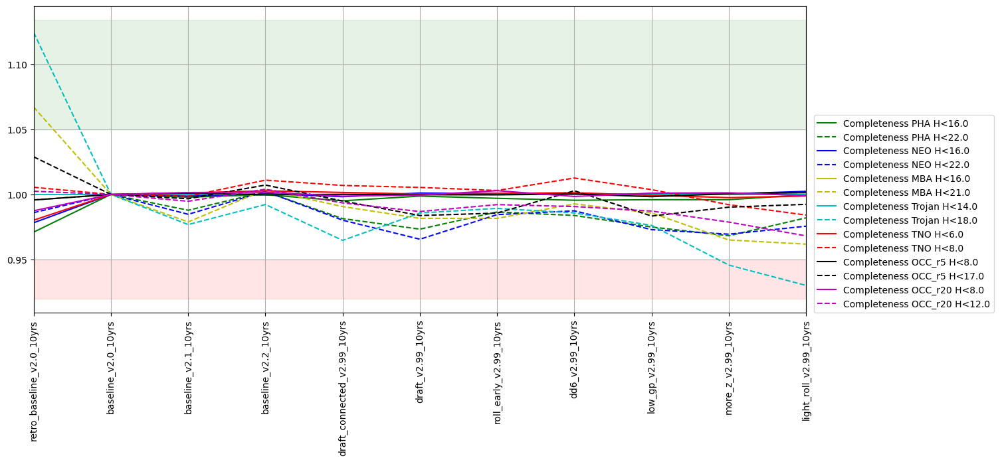

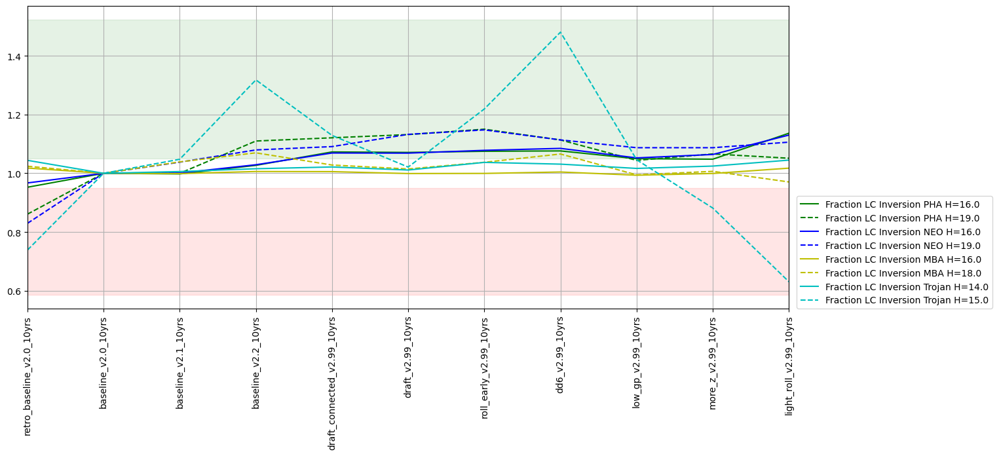

In [30]:
# sso metrics
k_sets = ['SSO discovery', 'SSO lightcurve inversion']

msub = metric_sets.loc[k_sets].reset_index('metric set')
fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, msub['metric']], 
                                   baseline_run=baseline_run,
                                   #metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=0.5)
fig.set_figwidth(15)


for k in k_sets:
    print(k)
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value')
    fig.set_figwidth(15)
    #ax.set_ylim(0.5, 1.5)
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')


/Users/lynnej/lsst_repos/rubin_sim/rubin_sim/maf/runComparison/summary_plots.py:326: UserWarning: There are infinite values in the plot of Median TgapsPercent_2-14hrs u band.
  warnings.warn(f"There are infinite values in the plot of {idx}.")


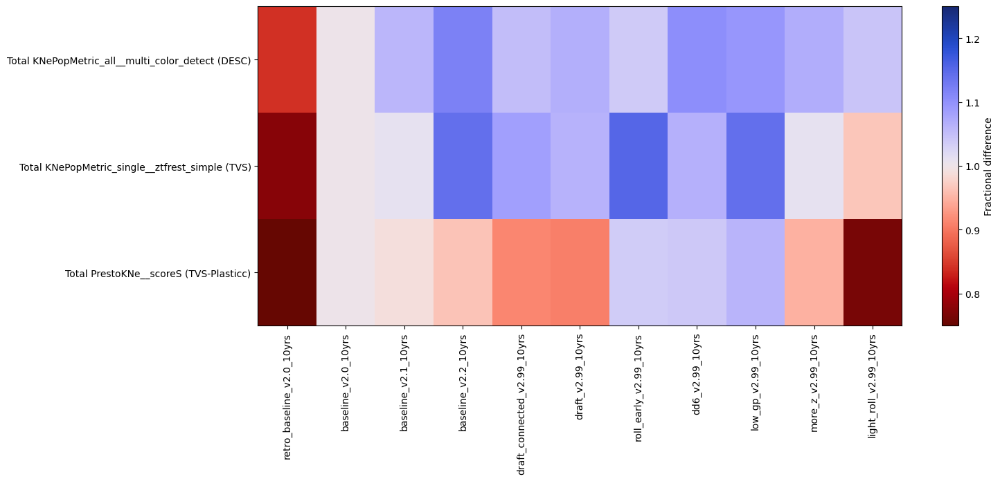

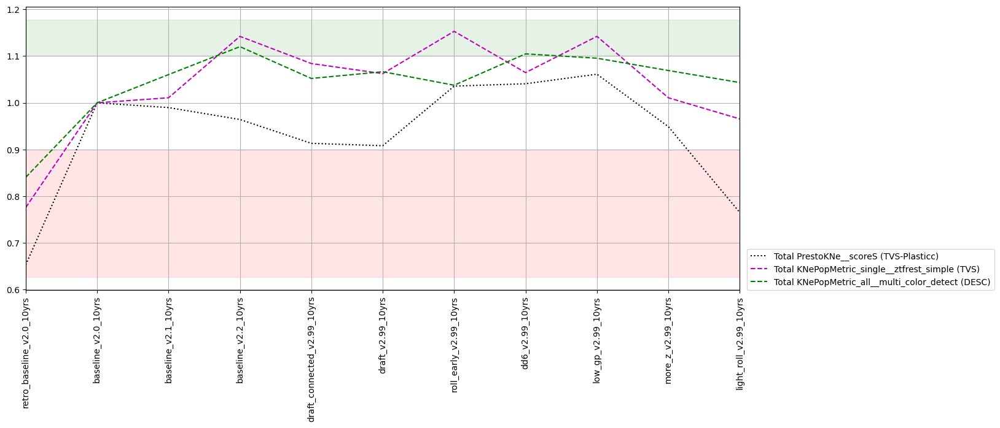

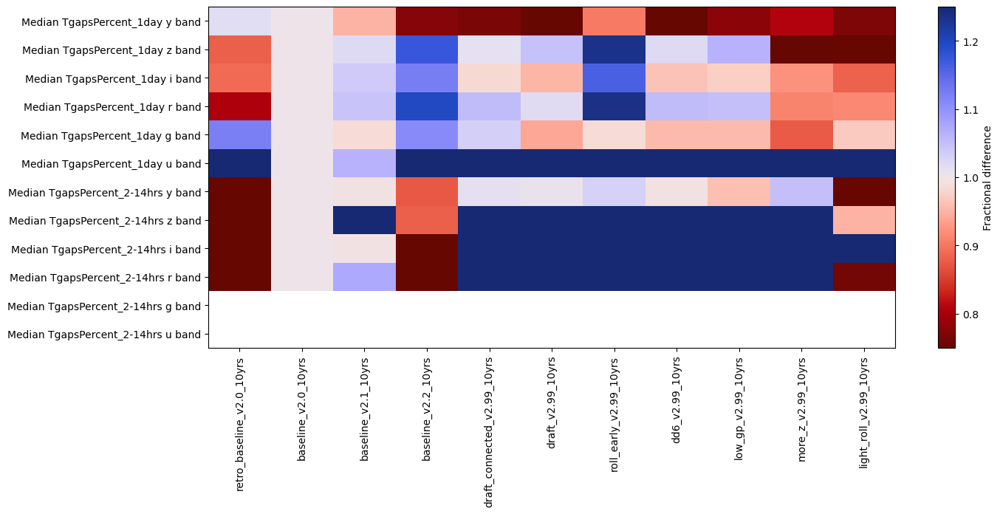

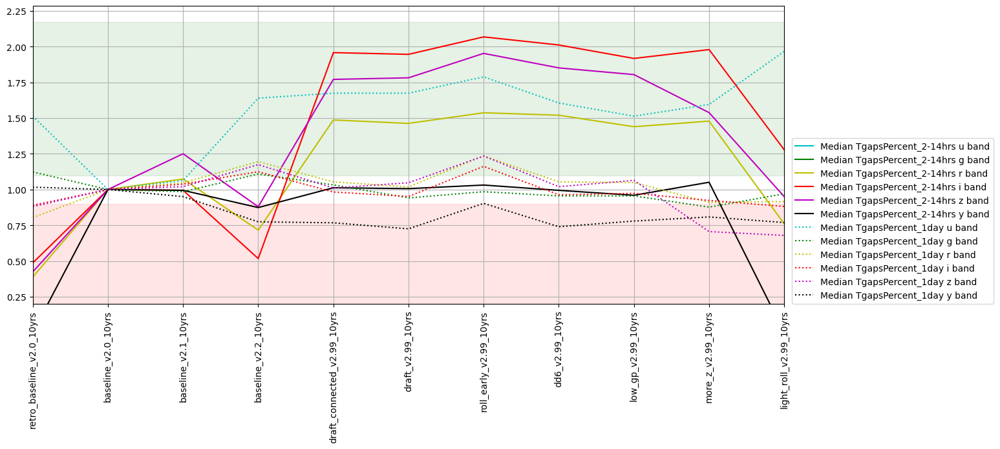

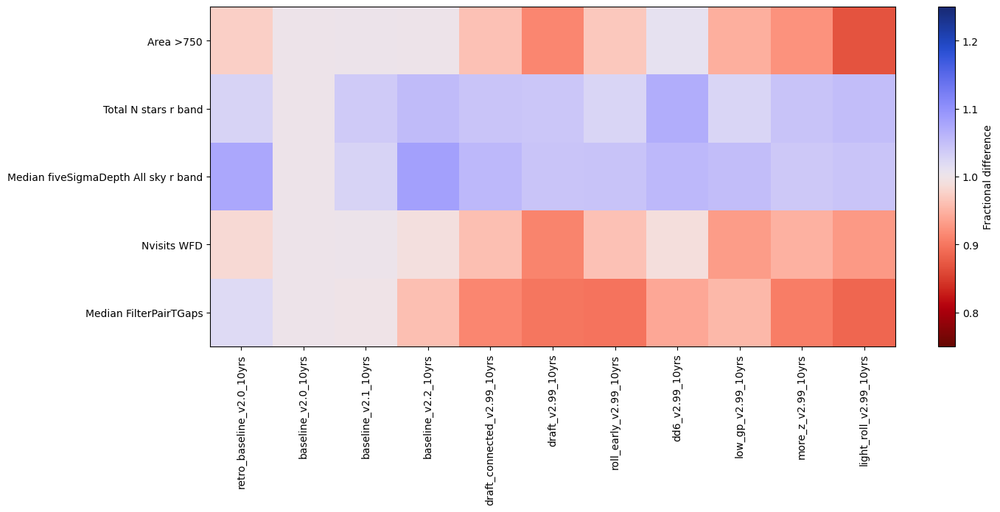

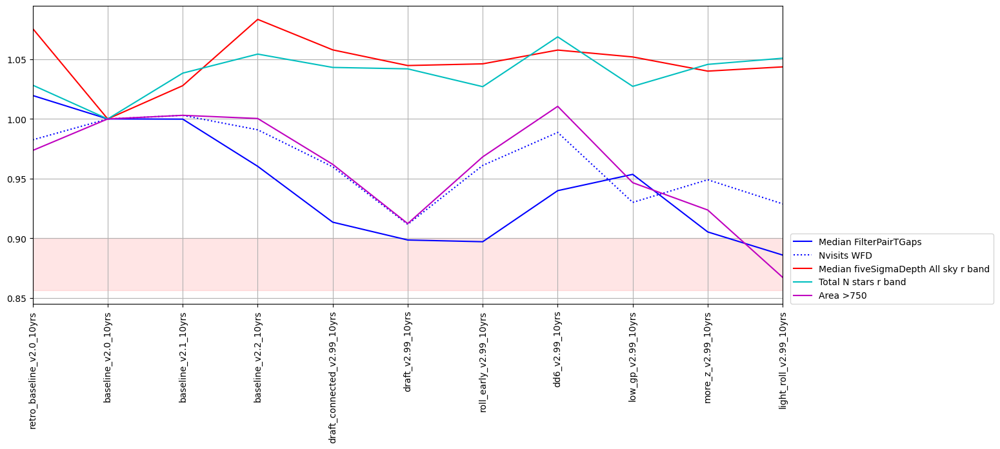

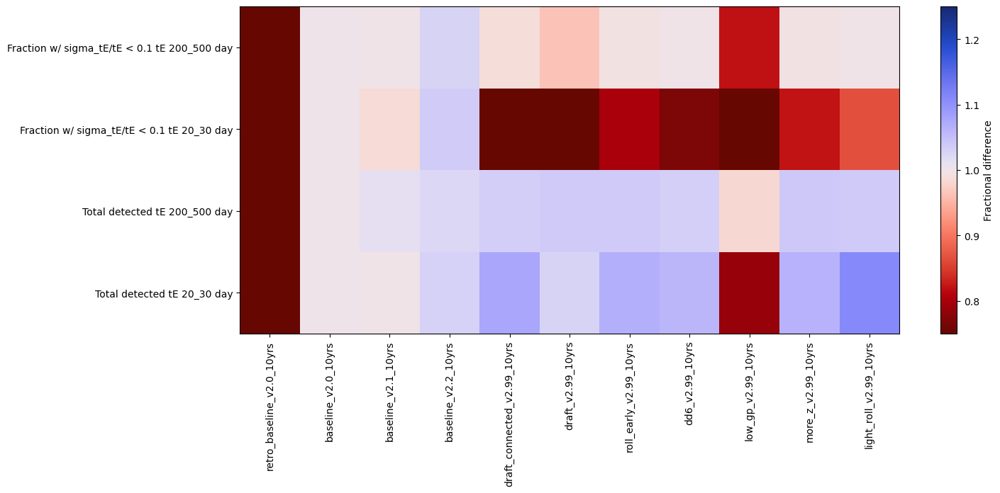

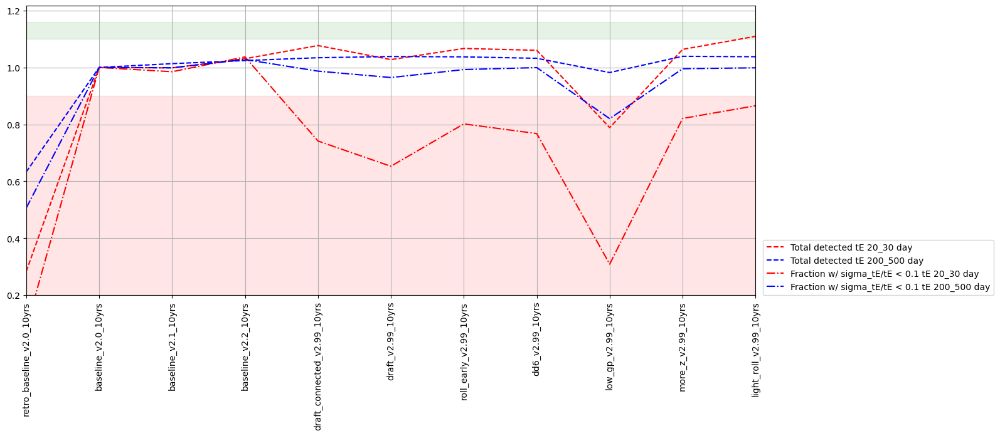

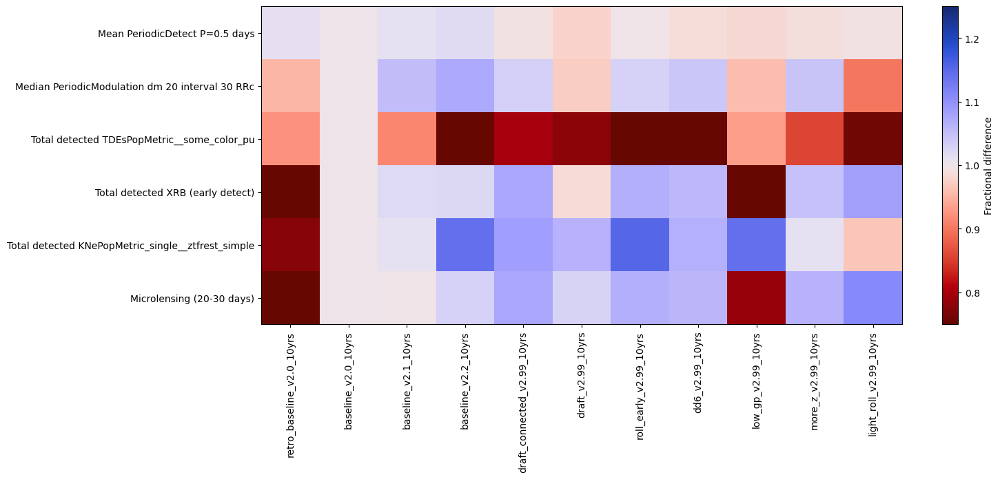

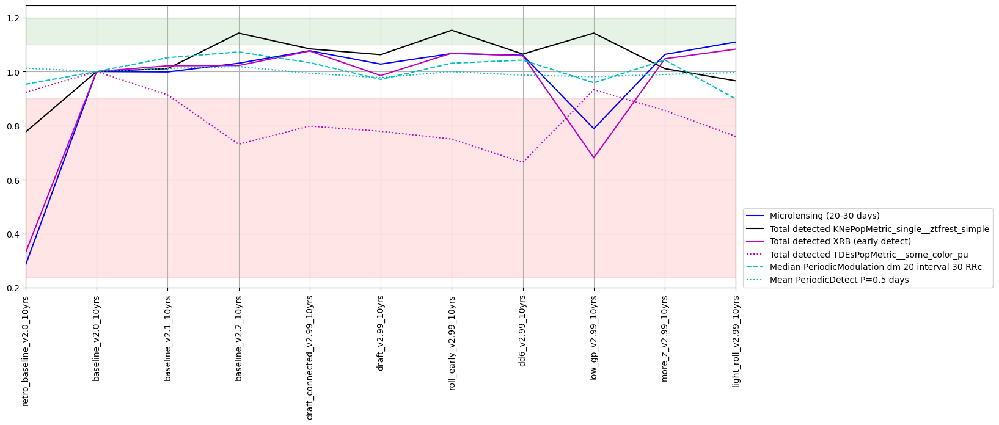

In [31]:
# TVS metrics
k_sets = [k for k in msets if k.startswith('TVS') and (k.endswith('short') or ('Tgaps' in k) or ('anomalies' in k)) ]

for k in k_sets:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                       baseline_run=baseline_run,
                                       metric_label_map=msub['short_name'],
                                       metric_set=msub,
                                      color_range=0.5)
    fig.set_figwidth(15)


    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value', 
                                 shade_fraction=0.1)
    fig.set_figwidth(15)
    ylim = list(ax.get_ylim())
    ax.set_ylim(max(0.2, ylim[0]), min(3, ylim[1]))
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')


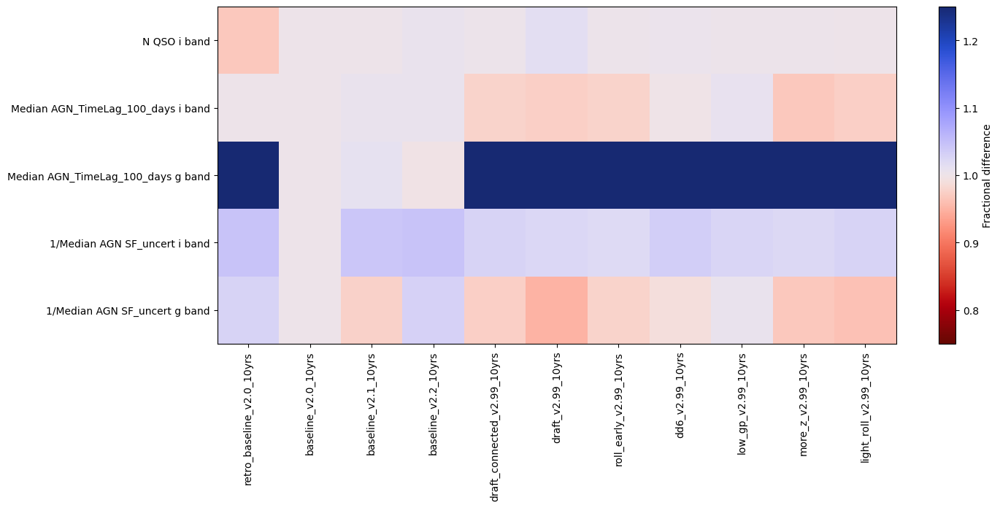

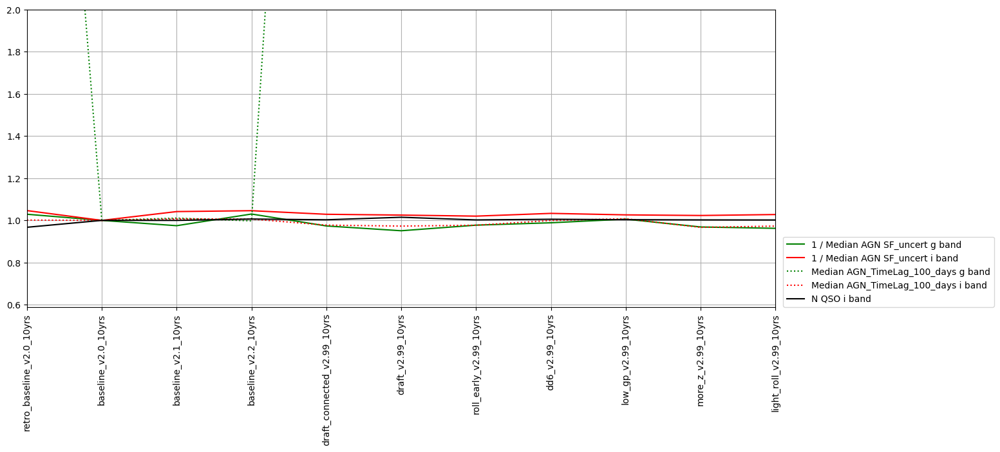

In [32]:
k = 'AGN short'
# AGN metrics
k_sets = ['AGN short']

msub = metric_sets.loc[k_sets].reset_index('metric set')
fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                   baseline_run=baseline_run,
                                   metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=0.5)
fig.set_figwidth(15)


for k in k_sets:
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value',
                                 shade_fraction=0)
    ylims = ax.get_ylim()
    ax.set_ylim(max(0.2, ylims[0]), min(2, ylims[1]))
    fig.set_figwidth(15)
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')

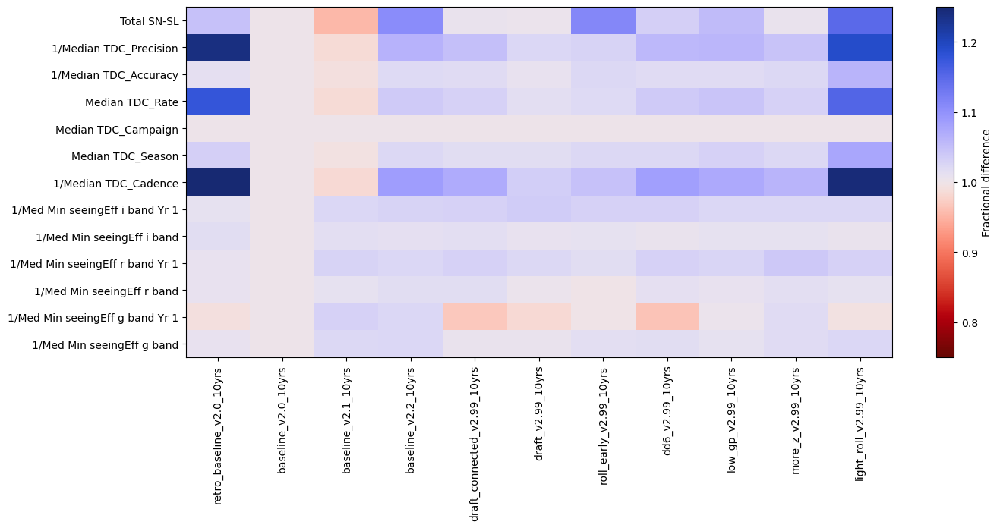

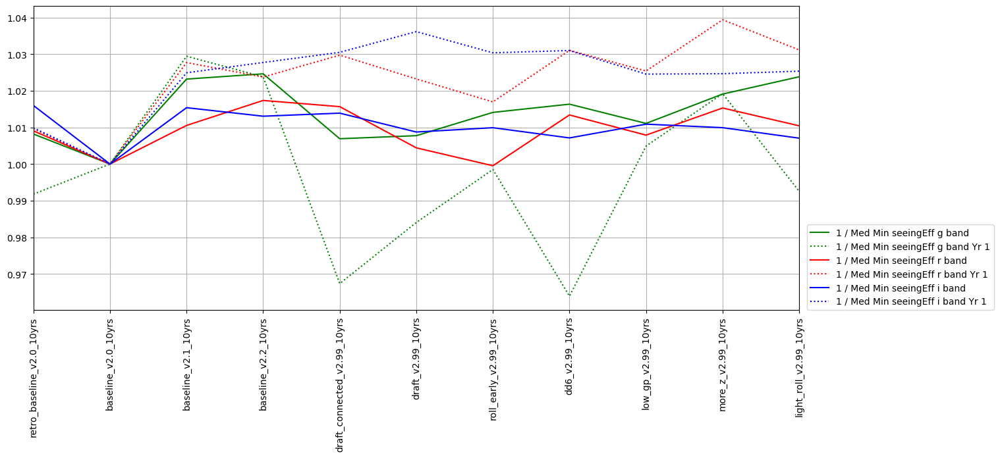

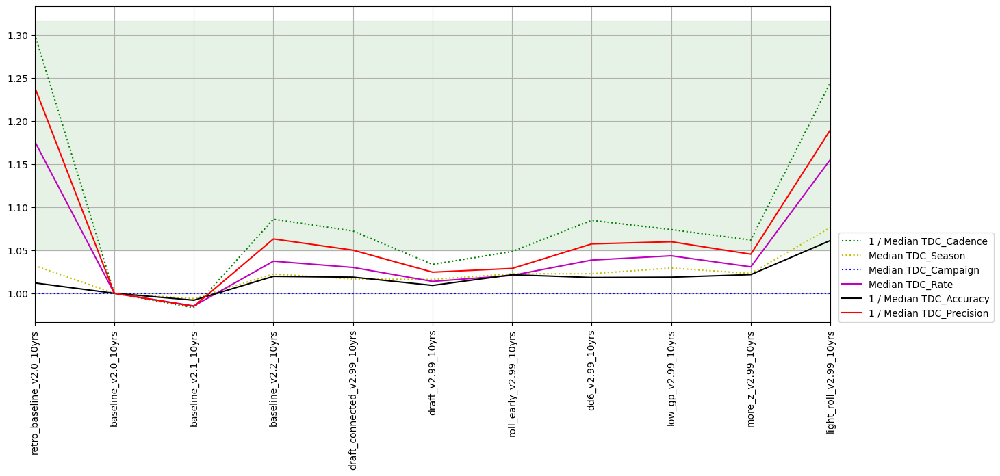

In [33]:
# StrongLensing metrics

k_sets = [k for k in msets if k.startswith('SL')]

msub = metric_sets.loc[k_sets].reset_index('metric set')
# Add the strong lensed supernova metric
msub = pd.concat([msub, 
                  metric_sets.loc['DESC WFD'].query('metric.str.contains("SNSL")', engine='python')])

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                   baseline_run=baseline_run,
                                   metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=0.5)
fig.set_figwidth(15)

for k in k_sets:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msub['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=msub,
                                  metric_label_map=msub['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value')
    fig.set_figwidth(15)
    #ax.set_ylim(0.5, 1.5)
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')


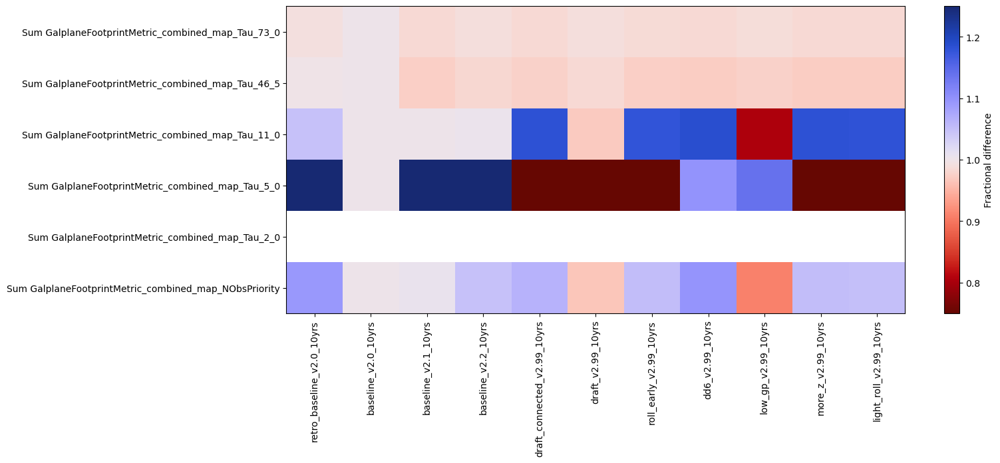

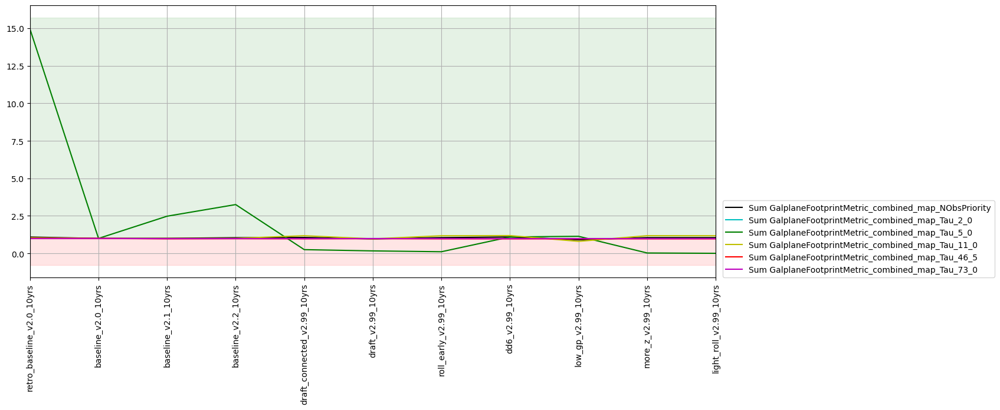

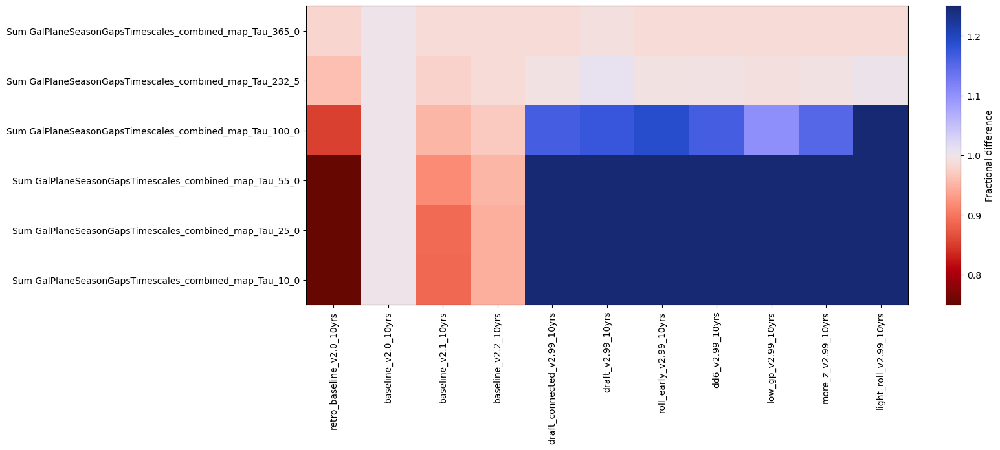

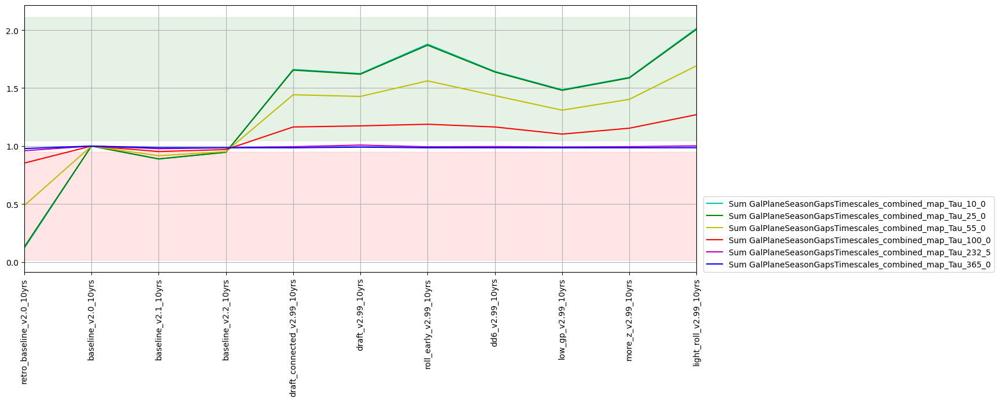

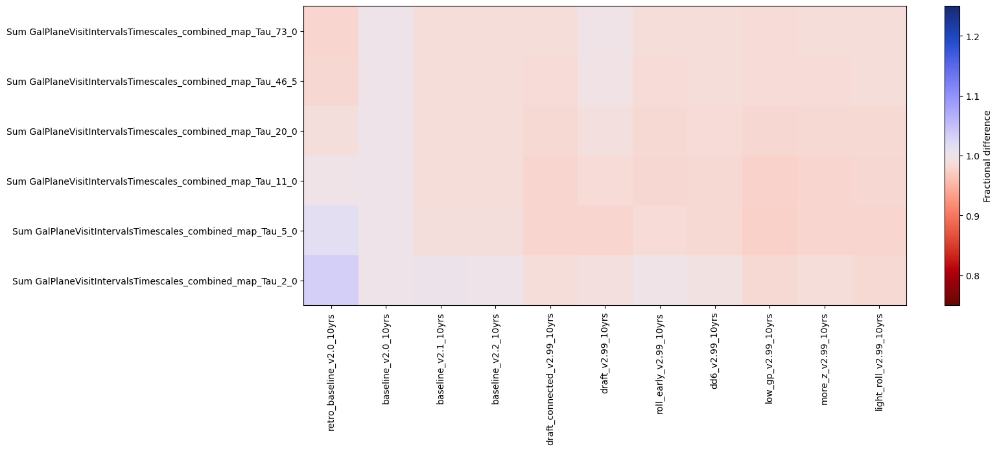

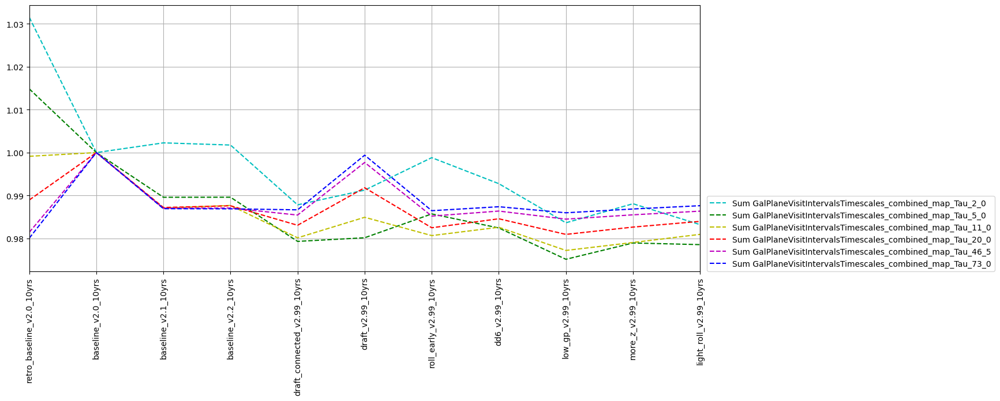

In [34]:
# GP footprint metrics
k_sets = [k for k in msets if k.startswith('GP') and 'filter' not in k]

for k in k_sets:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                       baseline_run=baseline_run,
                                       metric_label_map=msub['short_name'],
                                       metric_set=msub,
                                      color_range=0.5)
    fig.set_figwidth(15)


    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value')
    fig.set_figwidth(15)
    #ax.set_ylim(0.5, 1.5)
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')


Some of the trades above are due to DDF increases in time and adding the twilight NEO microsurvey, so let's check those benefits. 
(there are also trades due to changing the intranight cadence with triplets, but those should be reflected in the other metrics above, and likewise for the galactic plane footprint).

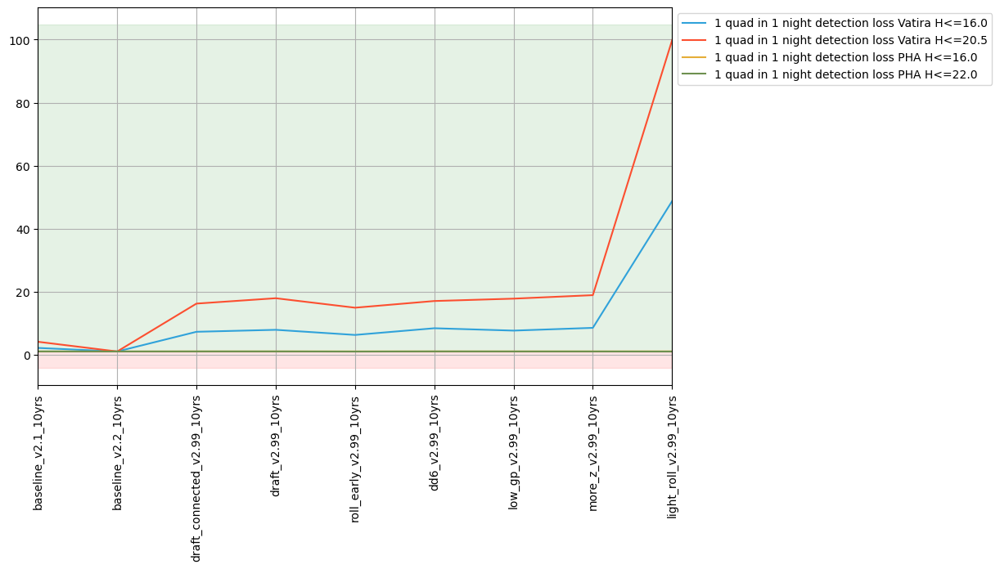

In [44]:
# microsurvey - vatira 
micro_discovery = [m for m in summaries if 'Vatira' in m and '1 quad in 1 night' in m ]
micro_discovery += [m for m in summaries if "PHA" in m and '1 quad in 1 night' in m and 'Nobj' not in m]

fig, ax = maf.plot_run_metric(summaries.loc[these_runs, micro_discovery].dropna(),
                            baseline_run='baseline_v2.2_10yrs',
                              linestyles=['-'],
                              markers=[''],
                             horizontal_quantity='run',
                             vertical_quantity='value')


In [36]:
# DDF -- compare to v2.2 as this was the first version with pre-scheduled DDFs 
# (v2.0/v2.1 are "non-prescheduled")

# Fraction of visits in DDFs
these_runs = ['baseline_v2.0_10yrs', 'baseline_v2.1_10yrs', 'baseline_v2.2_10yrs'] + draft_runs

pd.DataFrame(summaries.loc[these_runs, 'Nvisits DDF']/summaries.loc[these_runs, 'Nvisits All visits'],
            columns=['Fraction DDF']).round(3)

,Fraction DDF
run,
baseline_v2.0_10yrs,0.045
baseline_v2.1_10yrs,0.045
baseline_v2.2_10yrs,0.050
draft_connected_v2.99_10yrs,0.073
draft_v2.99_10yrs,0.087
roll_early_v2.99_10yrs,0.073
dd6_v2.99_10yrs,0.052
low_gp_v2.99_10yrs,0.072
more_z_v2.99_10yrs,0.080


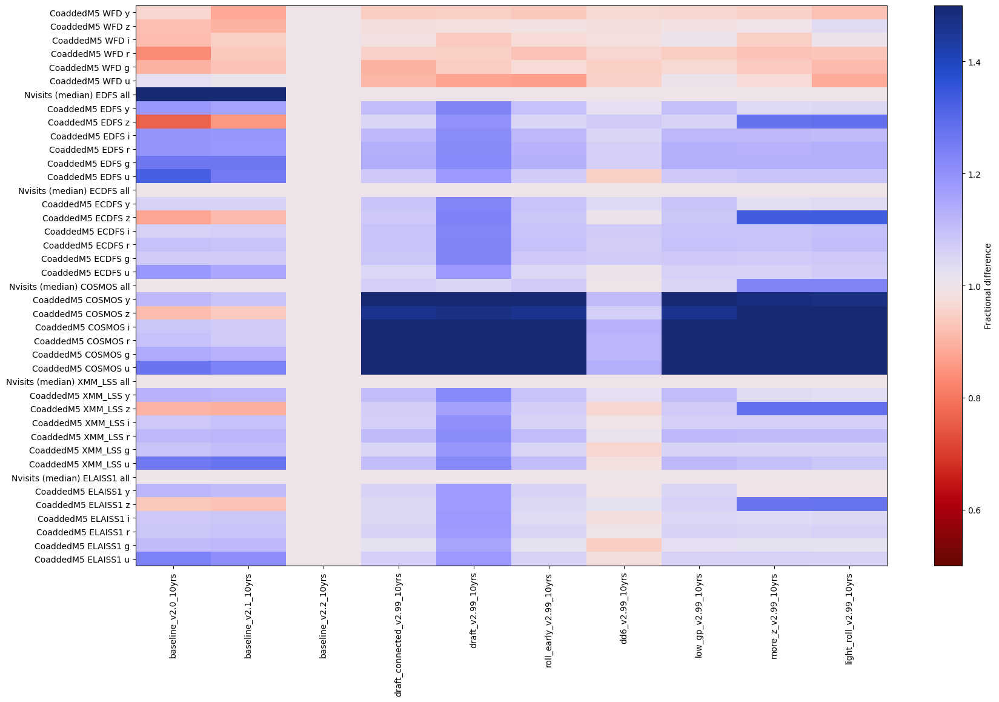

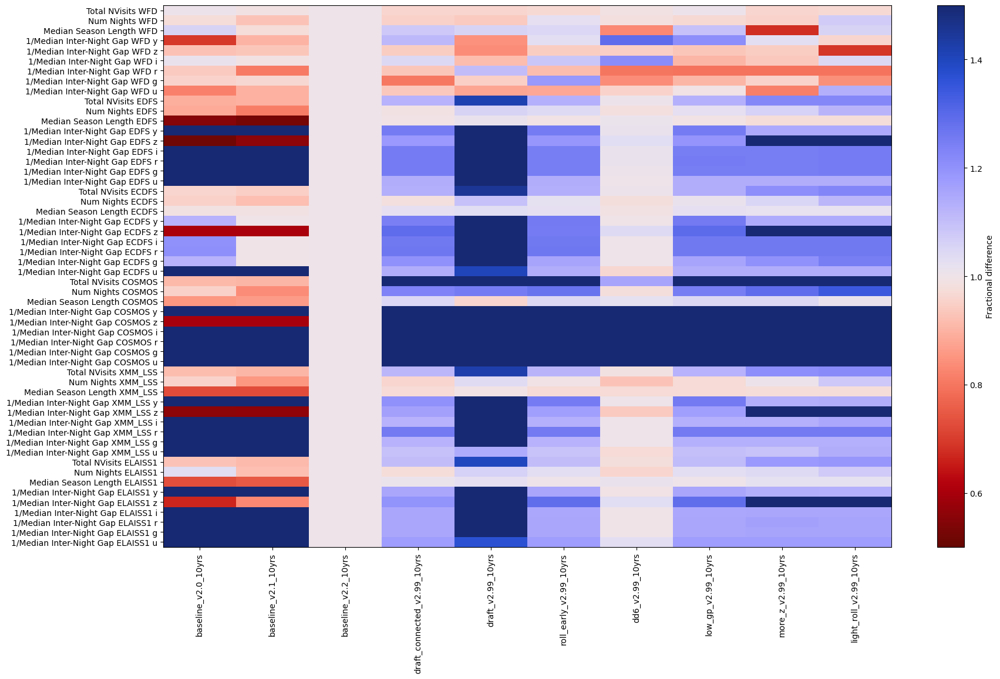

In [37]:
baseline = 'baseline_v2.2_10yrs'
these_runs = ['baseline_v2.0_10yrs', 'baseline_v2.1_10yrs', 'baseline_v2.2_10yrs'] + draft_runs

for m in ['DDF Depths', 'DDF Cadence']:
    metrics = metric_sets.loc[m]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                      baseline_run=baseline,
                                      metric_label_map=metrics['short_name'],
                                      metric_set=metrics, 
                                      color_range=1)
    fig.set_figwidth(20)
    fig.set_figheight(12)


In [38]:
msubm = metric_sets.loc['DDF Cadence'].query('metric.str.contains("Inter-Night")')
summaries.loc[these_runs, msubm['metric']]

metric,Mean DD:ELAISS1 Median Inter-Night Gap u band UserPointsSlicer,Mean DD:ELAISS1 Median Inter-Night Gap g band UserPointsSlicer,Mean DD:ELAISS1 Median Inter-Night Gap r band UserPointsSlicer,Mean DD:ELAISS1 Median Inter-Night Gap i band UserPointsSlicer,Mean DD:ELAISS1 Median Inter-Night Gap z band UserPointsSlicer,Mean DD:ELAISS1 Median Inter-Night Gap y band UserPointsSlicer,Mean DD:XMM_LSS Median Inter-Night Gap u band UserPointsSlicer,Mean DD:XMM_LSS Median Inter-Night Gap g band UserPointsSlicer,Mean DD:XMM_LSS Median Inter-Night Gap r band UserPointsSlicer,Mean DD:XMM_LSS Median Inter-Night Gap i band UserPointsSlicer,...,Mean DD:EDFS Median Inter-Night Gap r band UserPointsSlicer,Mean DD:EDFS Median Inter-Night Gap i band UserPointsSlicer,Mean DD:EDFS Median Inter-Night Gap z band UserPointsSlicer,Mean DD:EDFS Median Inter-Night Gap y band UserPointsSlicer,Mean DD:WFD Median Inter-Night Gap u band UserPointsSlicer,Mean DD:WFD Median Inter-Night Gap g band UserPointsSlicer,Mean DD:WFD Median Inter-Night Gap r band UserPointsSlicer,Mean DD:WFD Median Inter-Night Gap i band UserPointsSlicer,Mean DD:WFD Median Inter-Night Gap z band UserPointsSlicer,Mean DD:WFD Median Inter-Night Gap y band UserPointsSlicer
run,,,,,,,,,,,,,,,,,,,,,
baseline_v2.0_10yrs,3.000622,2.982181,2.979590,2.979589,24.940272,2.983836,2.982749,2.992879,2.991340,2.983401,...,3.955857,4.480980,31.939816,3.990780,26.704517,20.924252,5.879806,7.211764,8.129445,19.314549
baseline_v2.1_10yrs,3.960647,2.991370,2.997909,2.984199,20.043378,2.993568,3.018786,3.978624,3.986188,3.080698,...,3.973718,3.973123,29.455027,3.976269,24.434070,20.787144,6.855045,7.370982,8.066323,14.880234
baseline_v2.2_10yrs,25.763470,8.996258,8.976109,8.982109,16.651533,8.957424,25.001728,8.975515,8.971518,8.971518,...,8.931479,8.940015,16.520146,8.943705,21.903958,19.975326,5.528899,7.300853,7.518991,13.426797
draft_connected_v2.99_10yrs,21.965891,7.788870,7.769368,7.780970,13.900069,7.772177,22.806873,7.970165,7.152416,7.950335,...,7.137793,7.151093,13.984842,7.147999,23.424837,24.943913,5.930708,6.986769,7.983244,12.045625
draft_v2.99_10yrs,18.828872,5.987152,5.981491,5.981892,8.887227,5.965963,21.901029,5.996286,5.986104,5.992085,...,5.890328,5.901035,6.695727,5.900271,24.939648,21.109552,5.008872,7.977146,8.972138,15.862684
roll_early_v2.99_10yrs,21.966948,7.803122,7.789126,7.809702,12.932698,7.769287,22.860319,7.970541,7.143079,7.927617,...,7.153793,7.158248,13.877624,7.147844,24.884603,16.854503,6.027494,6.733435,7.986332,13.034799
dd6_v2.99_10yrs,25.001588,9.001489,8.995575,8.997300,16.112292,8.999978,25.767572,8.975256,8.969402,8.971276,...,8.797932,8.824703,16.000548,8.832839,22.899410,23.877785,6.935360,6.021458,7.924008,10.393284
low_gp_v2.99_10yrs,21.966951,7.802977,7.785121,7.801196,12.932866,7.755392,22.743936,7.949669,7.138505,7.927509,...,7.142914,7.162457,13.858301,7.132945,22.070228,22.042074,6.961067,8.061400,8.065987,11.111852
more_z_v2.99_10yrs,21.944247,7.774592,7.710855,7.771647,7.934185,7.882990,22.870880,7.949174,7.138114,7.926920,...,7.148129,7.163464,7.901884,7.813518,26.912498,20.917322,6.970137,7.801016,7.985169,13.057259


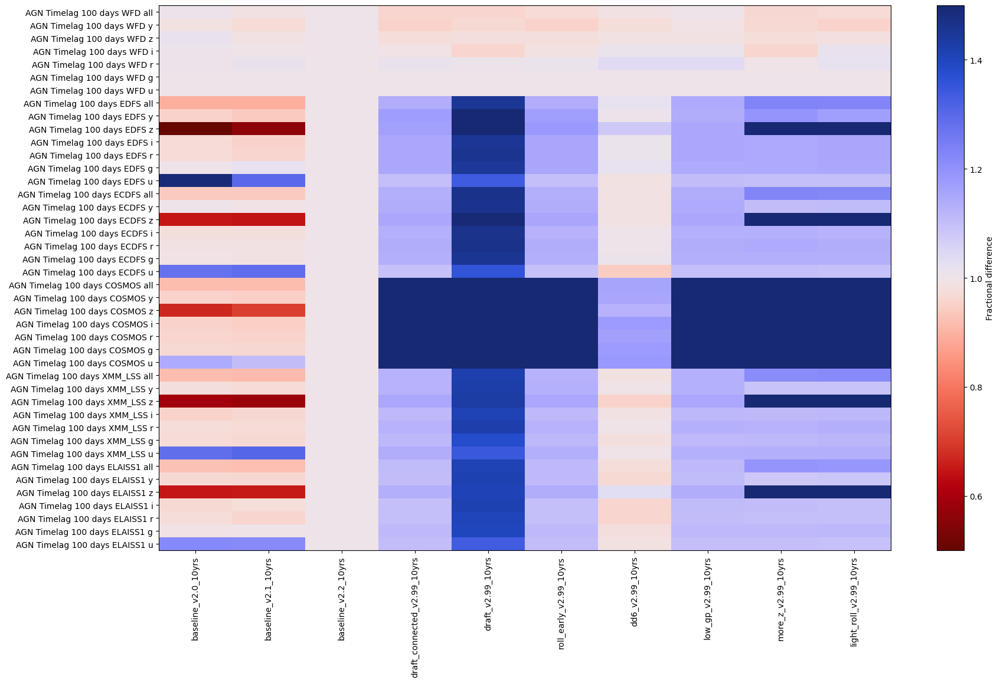

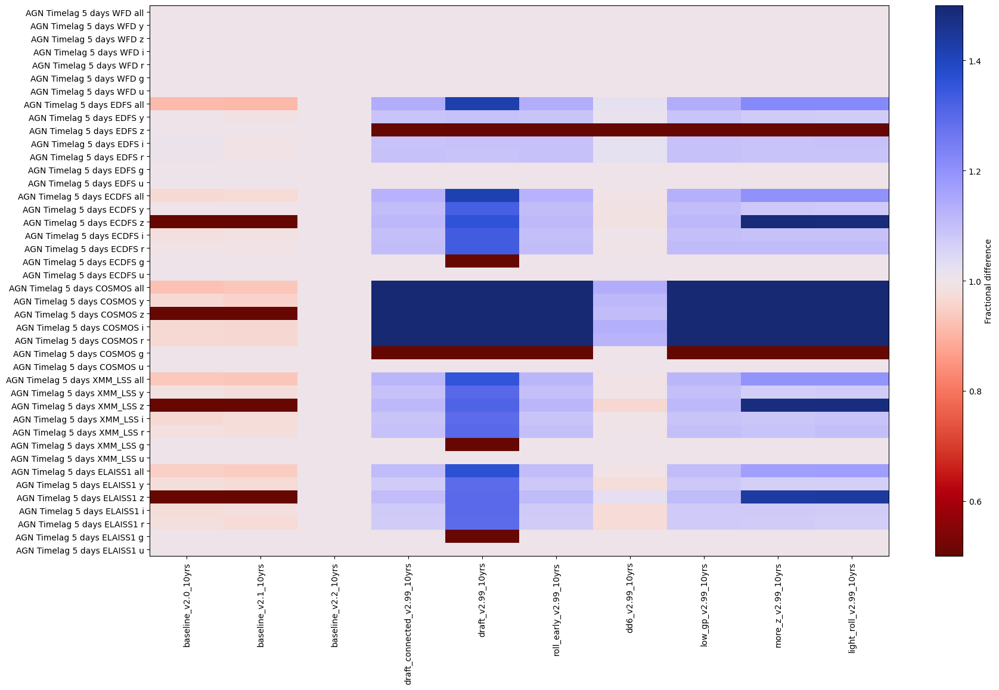

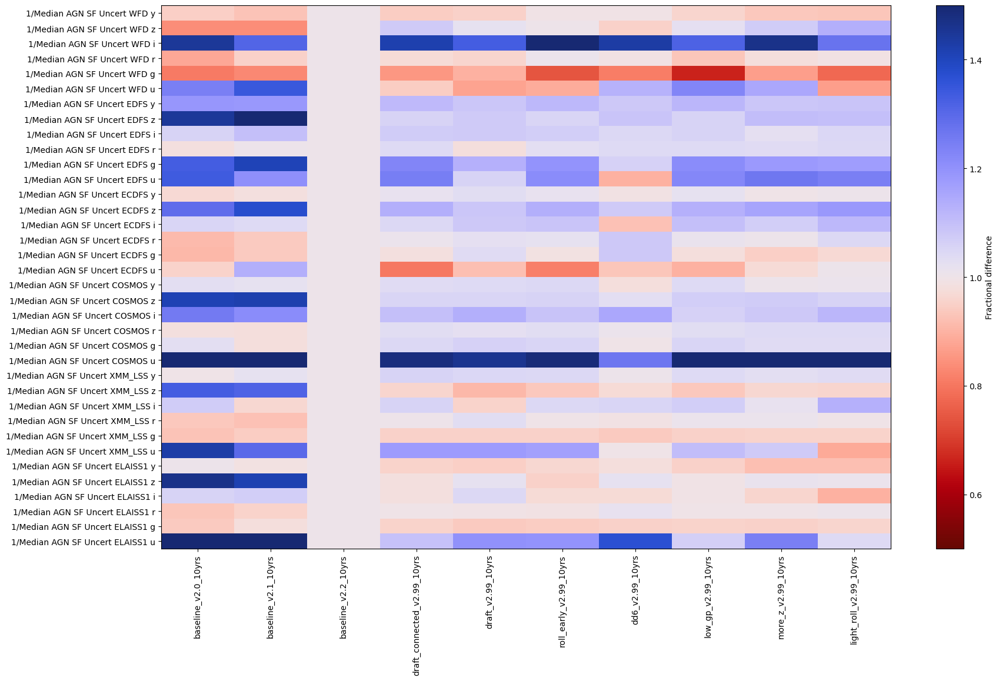

In [39]:
for m in ['AGN TimeLag 100 days DDF', 'AGN TimeLag 5 days DDF', 
          'AGN SF DDF']:
    metrics = metric_sets.loc[m]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                      baseline_run=baseline,
                                      metric_label_map=metrics['short_name'],
                                      metric_set=metrics, 
                                      color_range=1)
    fig.set_figwidth(20)
    fig.set_figheight(12)

metric,Median SNNSNMetric DD:ELAISS1_zlim DD:ELAISS1 all bands HealpixSubsetSlicer,Median SNNSNMetric DD:XMM_LSS_zlim DD:XMM_LSS all bands HealpixSubsetSlicer,Median SNNSNMetric DD:COSMOS_zlim DD:COSMOS all bands HealpixSubsetSlicer,Median SNNSNMetric DD:ECDFS_zlim DD:ECDFS all bands HealpixSubsetSlicer,Median SNNSNMetric DD:EDFS_zlim DD:EDFS all bands HealpixSubsetSlicer,Median SNNSNMetric DD:WFD_zlim DD:WFD all bands HealpixSubsetSlicer
run,,,,,,
baseline_v2.0_10yrs,0.593426,NaN,0.596891,0.543027,NaN,0.273350
baseline_v2.1_10yrs,0.594464,NaN,0.594427,0.545216,NaN,0.276185
baseline_v2.2_10yrs,0.600156,NaN,0.514987,0.577431,NaN,0.291496
draft_connected_v2.99_10yrs,0.545990,0.544654,0.597744,0.575390,0.526771,0.299941
draft_v2.99_10yrs,0.587685,0.574439,0.597502,0.592642,0.542995,0.292939
roll_early_v2.99_10yrs,0.546709,0.542028,0.597774,0.584387,0.523658,0.295913
dd6_v2.99_10yrs,NaN,0.538525,0.594086,0.547398,NaN,0.286117
low_gp_v2.99_10yrs,0.547389,0.541724,0.597758,0.574260,0.531980,0.288968
more_z_v2.99_10yrs,0.577607,0.564607,0.597081,0.590731,0.528353,0.296011


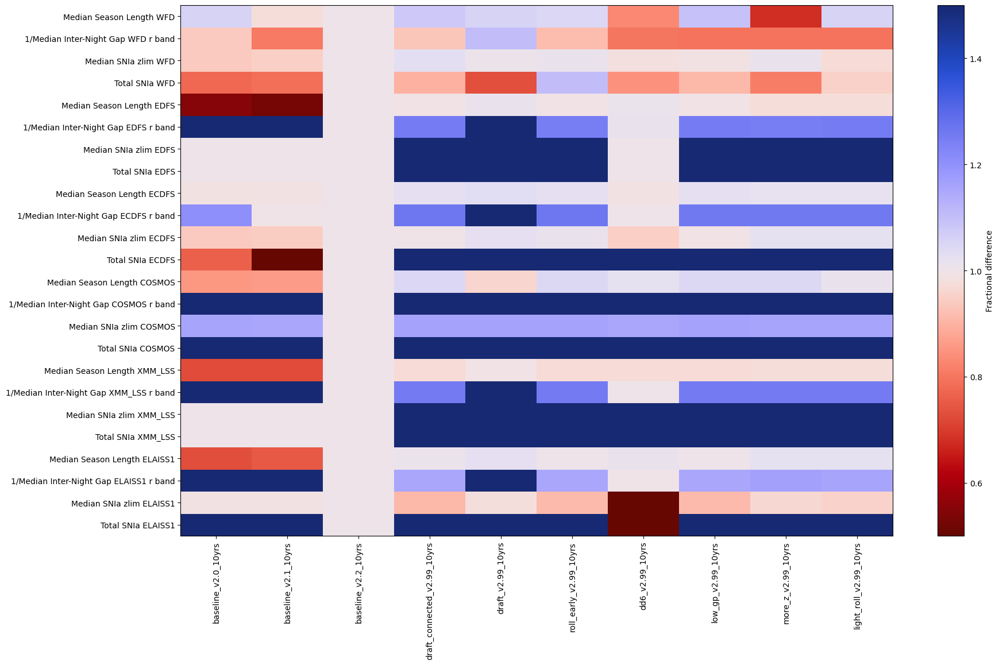

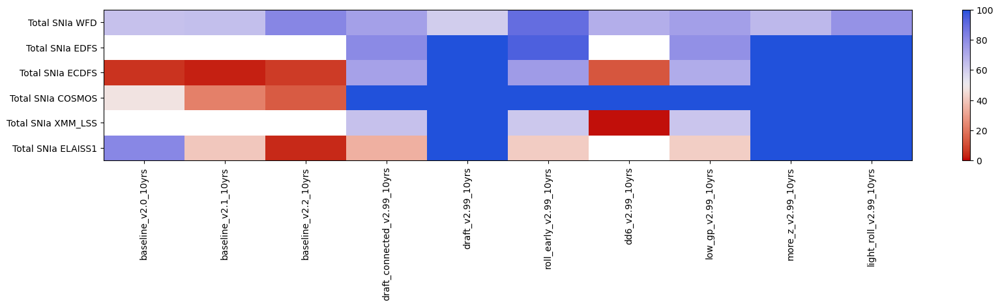

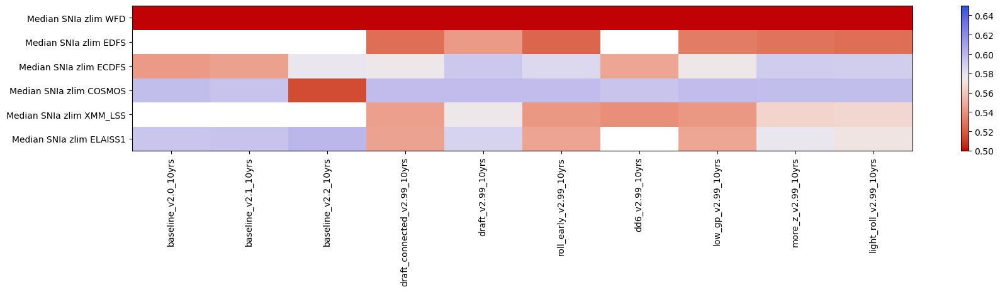

In [40]:
m = 'SNIa DDF'
these_runs = ['baseline_v2.0_10yrs', 'baseline_v2.1_10yrs', 'baseline_v2.2_10yrs'] + draft_runs

metrics = metric_sets.loc[m]
# the SN summary values default to -1.6e30 for 'bad values' but this screws up normalization, so replace.
t = summaries.loc[these_runs, metrics['metric']].copy()
t[t < 0] = 1e-30

# the SNIa metric reports 0 SN in many of the DDFs in the standard baselines,
# which makes this plot hard to interpret when normalized


metrics = metric_sets.loc[m]
fig, ax = maf.plot_run_metric_mesh(t,
                                  baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                  color_range=1)
fig.set_figwidth(20)
fig.set_figheight(12)

metrics = metric_sets.loc[m].query('metric.str.contains("Sum")', engine='python')
t = summaries.loc[these_runs, metrics['metric']].copy()
t[t < 0] = np.nan
fig, ax = maf.plot_run_metric_mesh(t.loc[these_runs, metrics['metric']],
                                  #baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                   cmap='cet_coolwarm_r',
                                  color_range=[0, 100])
fig.set_figwidth(20)
fig.set_figheight(3)

metrics = metric_sets.loc[m].query('metric.str.contains("zlim")', engine='python')
t = summaries.loc[these_runs, metrics['metric']].copy()
t[t < 0] = np.nan
fig, ax = maf.plot_run_metric_mesh(t.loc[these_runs, metrics['metric']],
                                  #baseline_run=baseline,
                                  metric_label_map=metrics['short_name'],
                                  metric_set=metrics, 
                                   cmap='cet_coolwarm_r',
                                  color_range=[0.5, 0.65])
fig.set_figwidth(20)
fig.set_figheight(3)
    
t

metric,Sum SNSLMetric DD:ELAISS1 all bands HealpixSubsetSlicer,Sum SNSLMetric DD:XMM_LSS all bands HealpixSubsetSlicer,Sum SNSLMetric DD:COSMOS all bands HealpixSubsetSlicer,Sum SNSLMetric DD:ECDFS all bands HealpixSubsetSlicer,Sum SNSLMetric DD:EDFS all bands HealpixSubsetSlicer,Sum SNSLMetric DD:WFD all bands HealpixSubsetSlicer
run,,,,,,
baseline_v2.0_10yrs,0.015108,0.014272,0.014076,0.014287,0.023664,0.008779
baseline_v2.1_10yrs,0.013812,0.013001,0.012324,0.013522,0.024114,0.009340
baseline_v2.2_10yrs,0.013993,0.014243,0.014460,0.014000,0.027733,0.011644
draft_connected_v2.99_10yrs,0.013139,0.013669,0.018334,0.013325,0.025336,0.010677
draft_v2.99_10yrs,0.015371,0.015259,0.018222,0.015407,0.027099,0.008598
roll_early_v2.99_10yrs,0.014772,0.014703,0.018517,0.013550,0.027485,0.009803
dd6_v2.99_10yrs,0.013549,0.012668,0.013877,0.012821,0.026534,0.009501
low_gp_v2.99_10yrs,0.014230,0.013412,0.018918,0.013692,0.026091,0.009753
more_z_v2.99_10yrs,0.014692,0.014479,0.019207,0.014351,0.028084,0.009205


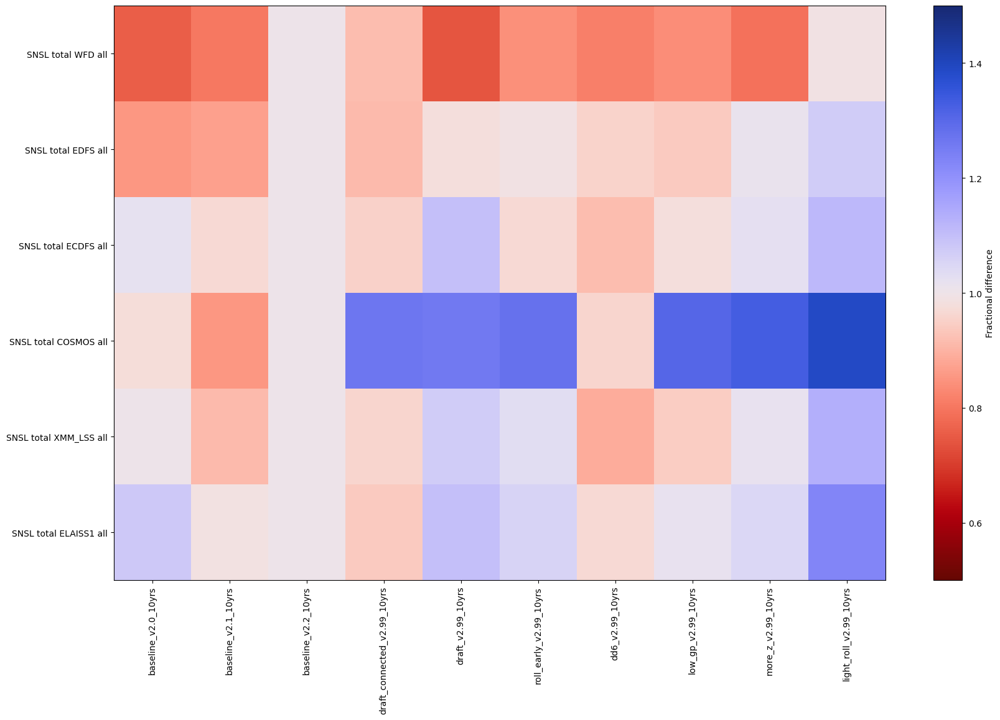

In [41]:
# The strong lensed SN are just very rare, so they show slight changes here but the actual values are likely
# equivalent 
for m in ['SNSL DDF']:
    metrics = metric_sets.loc[m]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, metrics['metric']],
                                      baseline_run=baseline,
                                      metric_label_map=metrics['short_name'],
                                      metric_set=metrics, 
                                      color_range=1)
    fig.set_figwidth(20)
    fig.set_figheight(12)
    

summaries.loc[these_runs, metric_sets.loc['SNSL DDF']['metric']]

In [42]:
summaries.loc[these_runs,
              ['fONv MedianNvis fO  HealpixSlicer', 'fONv MinNvis fO  HealpixSlicer', 
               'fOArea_750 fO All sky HealpixSlicer', 'fOArea fO  HealpixSlicer']]

metric,fONv MedianNvis fO HealpixSlicer,fONv MinNvis fO HealpixSlicer,fOArea_750 fO All sky HealpixSlicer,fOArea fO HealpixSlicer
run,,,,
baseline_v2.0_10yrs,839.0,787.0,18620.568813,12893.228978
baseline_v2.1_10yrs,838.0,784.0,18676.801487,12434.135354
baseline_v2.2_10yrs,830.0,779.0,18627.283162,10569.224874
draft_connected_v2.99_10yrs,792.0,748.0,17912.204976,1953.036312
draft_v2.99_10yrs,790.0,729.0,16988.142673,2112.502105
roll_early_v2.99_10yrs,792.0,750.0,18028.866793,1945.482670
dd6_v2.99_10yrs,810.0,766.0,18816.963526,5309.371600
low_gp_v2.99_10yrs,822.0,667.0,17626.005843,8264.524524
more_z_v2.99_10yrs,785.0,742.0,17199.644671,1371.405816


In [43]:
summaries.loc[these_runs, metric_sets.loc['SRD']['metric']]

metric,fONv MedianNvis fO All sky HealpixSlicer,Median Parallax Uncert (18k) Parallax Uncert @ 22.4 All sky HealpixSlicer,Median Parallax Uncert (18k) Parallax Uncert @ 24.0 All sky HealpixSlicer,Median Proper Motion Uncert (18k) Proper Motion Uncert @ 20.5 All sky HealpixSlicer,Median Proper Motion Uncert (18k) Proper Motion Uncert @ 24.0 All sky HealpixSlicer
run,,,,,
baseline_v2.0_10yrs,839.0,2.423048,9.831244,0.190588,2.344119
baseline_v2.1_10yrs,838.0,2.329280,9.328171,0.188435,2.217359
baseline_v2.2_10yrs,830.0,2.267676,9.054113,0.186646,2.193021
draft_connected_v2.99_10yrs,792.0,2.372297,9.544178,0.190292,2.258448
draft_v2.99_10yrs,790.0,2.463777,9.950573,0.191643,2.307288
roll_early_v2.99_10yrs,792.0,2.384471,9.622518,0.192004,2.286203
dd6_v2.99_10yrs,810.0,2.327868,9.372435,0.189157,2.244878
low_gp_v2.99_10yrs,822.0,2.388575,9.579722,0.187611,2.216556
more_z_v2.99_10yrs,785.0,2.380450,9.552361,0.191277,2.264694


Parallax uncertainties are reported in milliarcseconds, proper motion is milliarcseconds per year. 